# **1. Data Preprocessing**

## **1.1 Load Dataset**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import pandas as pd
fake_news = pd.read_csv('/content/drive/MyDrive/News-_dataset/Fake.csv')
true_news = pd.read_csv('/content/drive/MyDrive/News-_dataset/True.csv')

In [ ]:
import pandas as pd
fake_news = pd.read_csv('Fake.csv')
true_news = pd.read_csv('True.csv')

FileNotFoundError: [Errno 2] No such file or directory: 'Fake.csv'

In [ ]:
import pandas as pd

# Suppose your DataFrame is 'fake_news'
print(fake_news.info())          # check data types and missing values
print(fake_news.head())          # quick look at the first rows


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23481 entries, 0 to 23480
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   title    23481 non-null  object
 1   text     23481 non-null  object
 2   subject  23481 non-null  object
 3   date     23481 non-null  object
dtypes: object(4)
memory usage: 733.9+ KB
None
                                               title  \
0   Donald Trump Sends Out Embarrassing New Year’...   
1   Drunk Bragging Trump Staffer Started Russian ...   
2   Sheriff David Clarke Becomes An Internet Joke...   
3   Trump Is So Obsessed He Even Has Obama’s Name...   
4   Pope Francis Just Called Out Donald Trump Dur...   

                                                text subject  \
0  Donald Trump just couldn t wish all Americans ...    News   
1  House Intelligence Committee Chairman Devin Nu...    News   
2  On Friday, it was revealed that former Milwauk...    News   
3  On Christmas day, Donald Tr

In [ ]:
fake_news['date'] = pd.to_datetime(fake_news['date'], errors='coerce')
# handle any errors or NaT if needed


In [ ]:
fake_news

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,2017-12-31
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,2017-12-31
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,2017-12-30
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,2017-12-29
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,2017-12-25
...,...,...,...,...
23476,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,2016-01-16
23477,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,2016-01-16
23478,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,2016-01-15
23479,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,2016-01-14


In [ ]:
fake_news['subject'].value_counts()

,count
subject,
News,9050
politics,6841
left-news,4459
Government News,1570
US_News,783
Middle-east,778


# **2. Data Visualization and Exploration**

### **2.1 Exploring columns of the news dataset**

<ipython-input-8-761fa309819c>:20: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="News Type", loc="best")


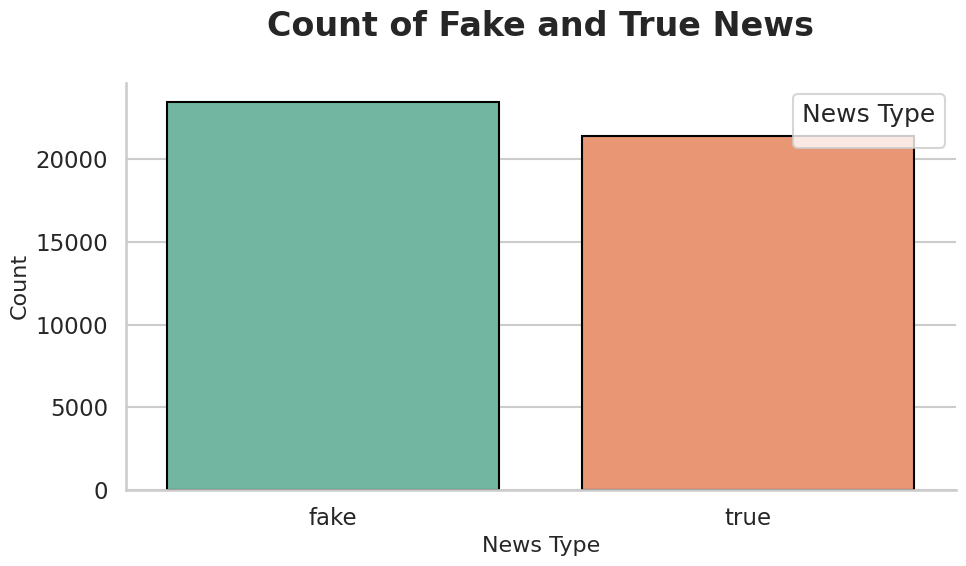

In [ ]:

import matplotlib.pyplot as plt
import seaborn as sns

# Combine fake and true news dataframes
fake_news['label'] = 'fake'
true_news['label'] = 'true'
combined_news = pd.concat([fake_news, true_news], ignore_index=True)


# Set a nice style and context
sns.set_theme(style="whitegrid", context="talk")
plt.figure(figsize=(10, 6))

# Count plot for the combined dataset
sns.countplot(data=combined_news, x="label", hue="label", palette="Set2", edgecolor="black")
plt.title("Count of Fake and True News\n", fontsize=24, fontweight="bold")
plt.xlabel("News Type", fontsize=16)
plt.ylabel("Count", fontsize=16)
plt.xticks(rotation=0) # No need for rotation here
plt.legend(title="News Type", loc="best")
sns.despine()
plt.tight_layout()
plt.show()


<ipython-input-9-2954f7d351e9>:27: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Subject", loc="best")


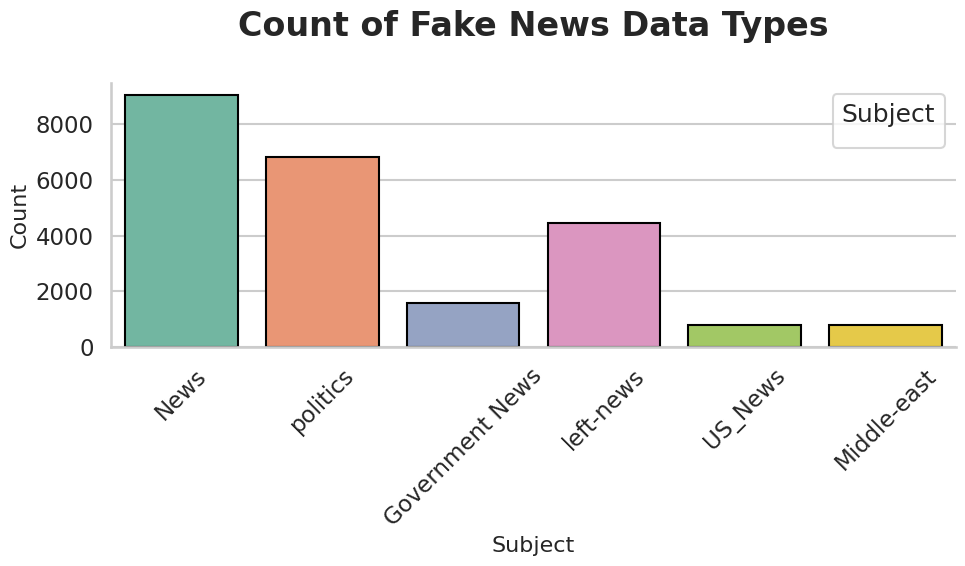

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set a nice style and context
sns.set_theme(style="whitegrid", context="talk")
# or context="notebook"/"paper"/"poster", etc.

plt.figure(figsize=(10, 6))

# Make a count plot with a custom palette and some aesthetic options
sns.countplot(
    data=fake_news,
    x="subject",
    hue="subject",  # same as in your code
    palette="Set2",  # try "Set1", "Set2", "husl", "Paired", etc.
    edgecolor="black"
)

plt.title("Count of Fake News Data Types\n", fontsize=24, fontweight="bold")
plt.xlabel("Subject", fontsize=16)
plt.ylabel("Count", fontsize=16)

# Rotate x-ticks if the category names are long
plt.xticks(rotation=45)

# Customize the legend
plt.legend(title="Subject", loc="best")

# Remove top/right spines
sns.despine()

plt.tight_layout()
plt.show()


<ipython-input-10-43d1bea78be1>:27: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Subject", loc="best")


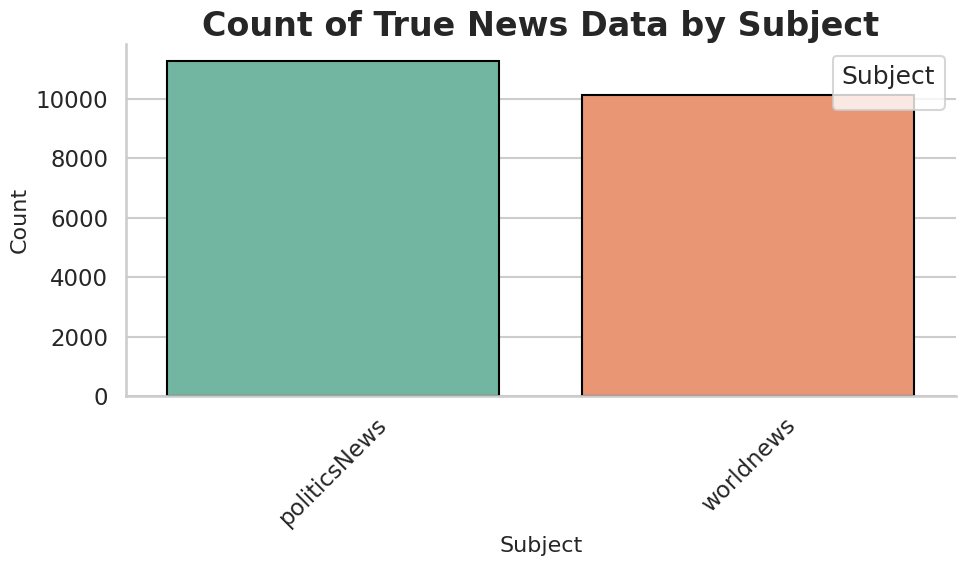

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set an appealing style and context
sns.set_theme(style="whitegrid", context="talk")

plt.figure(figsize=(10, 6))

# Suppose you want to plot the counts of each 'subject' in "fake_news"
sns.countplot(
    data=true_news,
    x="subject",         # which column you want on the x-axis
    hue="subject",       # if you also want to distinguish by the same column
    palette="Set2",      # try other palettes like "Set1", "Paired", etc.
    edgecolor="black"
)

# Title and labels
plt.title("Count of True News Data by Subject", fontsize=24, fontweight="bold")
plt.xlabel("Subject", fontsize=16)
plt.ylabel("Count", fontsize=16)

# Rotate x-ticks if needed
plt.xticks(rotation=45)

# Legend
plt.legend(title="Subject", loc="best")

# Remove top/right spines to give a cleaner look
sns.despine()

plt.tight_layout()
plt.show()


In [ ]:
#!pip install nltk
import nltk
nltk.download('punkt_tab') # Download the punkt_tab data package

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import re
import string
from bs4 import BeautifulSoup

def clean_text(text):
    if isinstance(text, str):
        text = BeautifulSoup(text, 'html.parser').get_text()
        text = re.sub(r"[^a-zA-Z]", " ", text)
        text = text.translate(str.maketrans("", "", string.punctuation))
        text = re.sub(r'\[video\]|\(video\)', '', text)

        emoji_pattern = re.compile("["
                                   u"\U0001F600-\U0001F64F"
                                   u"\U0001F300-\U0001F5FF"
                                   u"\U0001F680-\U0001F6FF"
                                   u"\U0001F1E0-\U0001F1FF"
                                   u"\U00002702-\U000027B0"
                                   u"\U000024C2-\U0001F251"
                                   "]+", flags=re.UNICODE)
        text = emoji_pattern.sub(r'', text)
        text = re.sub(r'[\(\)\[\]]', '', text)
        text = re.sub(r"#.*", "", text)
        text = re.sub(r"/\*.*?\*/", "", text, flags=re.DOTALL)
        text = text.lower()
        nltk_stop_words = set(stopwords.words('english'))
        tokens = word_tokenize(text)
        tokens = [word for word in tokens if word not in nltk_stop_words]

        text = ' '.join(tokens)

        return text
    else:
        return ""

In [ ]:
fake_news["text"]=fake_news["text"].apply(clean_text)
true_news['text'] = true_news['text'].apply(clean_text)

<ipython-input-13-29b76ba1d8e0>:9: MarkupResemblesLocatorWarning: The input passed in on this line looks more like a URL than HTML or XML.

If you meant to use Beautiful Soup to parse the web page found at a certain URL, then something has gone wrong. You should use an Python package like 'requests' to fetch the content behind the URL. Once you have the content as a string, you can feed that string into Beautiful Soup.

However, if you want to parse some data that happens to look like a URL, then nothing has gone wrong: you are using Beautiful Soup correctly, and this warning is spurious and can be filtered. To make this warning go away, run this code before calling the BeautifulSoup constructor:

    from bs4 import MarkupResemblesLocatorWarning
    import warnings

    warnings.filterwarnings("ignore", category=MarkupResemblesLocatorWarning)
    
  text = BeautifulSoup(text, 'html.parser').get_text()


In [ ]:

import nltk
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()

def lemmatize_text(text):
    lemmatized_words = [lemmatizer.lemmatize(word) for word in text.split()]
    return " ".join(lemmatized_words)

fake_news['title'] = fake_news['title'].apply(lemmatize_text)
fake_news['text'] = fake_news['text'].apply(lemmatize_text)
true_news['title'] = true_news['title'].apply(lemmatize_text)
true_news['text'] = true_news['text'].apply(lemmatize_text)


[nltk_data] Downloading package wordnet to /root/nltk_data...


### **2.2 Data Vsiualization for Title column**

In [ ]:
from collections import Counter

def get_most_frequent_words(df, column_name, num_words=30):
    all_words = []
    for text in df[column_name]:
        words = text.lower().split()
        all_words.extend(words)

    word_counts = Counter(all_words)
    most_common_words = word_counts.most_common(num_words)
    return most_common_words

# Get most frequent words in 'title' for fake news
fake_news_frequent_words = get_most_frequent_words(fake_news, 'title')
print("Most frequent words in fake news titles:", fake_news_frequent_words)

# Get most frequent words in 'title' for true news
true_news_frequent_words = get_most_frequent_words(true_news, 'title')
print("Most frequent words in true news titles:", true_news_frequent_words)


Most frequent words in fake news titles: [('to', 9443), ('trump', 6615), ('the', 5978), ('of', 5141), ('[video]', 5054), ('for', 4793), ('in', 4493), ('on', 3594), ('a', 3592), ('and', 3482), ('is', 2757), ('(video)', 2543), ('with', 2435), ('about', 1688), ('obama', 1645), ('his', 1628), ('hillary', 1591), ('after', 1529), ('trump’s', 1450), ('just', 1388), ('at', 1373), ('by', 1372), ('from', 1222), ('watch:', 1212), ('this', 1074), ('who', 1055), ('he', 1033), ('are', 984), ('president', 971), ('over', 946)]
Most frequent words in true news titles: [('to', 7798), ('in', 4591), ('trump', 4405), ('u.s.', 3872), ('on', 3333), ('say', 3210), ('of', 3009), ('for', 2770), ('a', 1582), ('with', 1496), ('house', 1386), ('after', 1023), ('over', 1002), ('north', 920), ('at', 873), ('new', 860), ('white', 804), ('not', 763), ('from', 760), ('senate', 726), ('russia', 718), ('court', 711), ('will', 709), ('korea', 695), ('state', 680), ("trump's", 669), ('tax', 633), ('republican', 624), ('bil

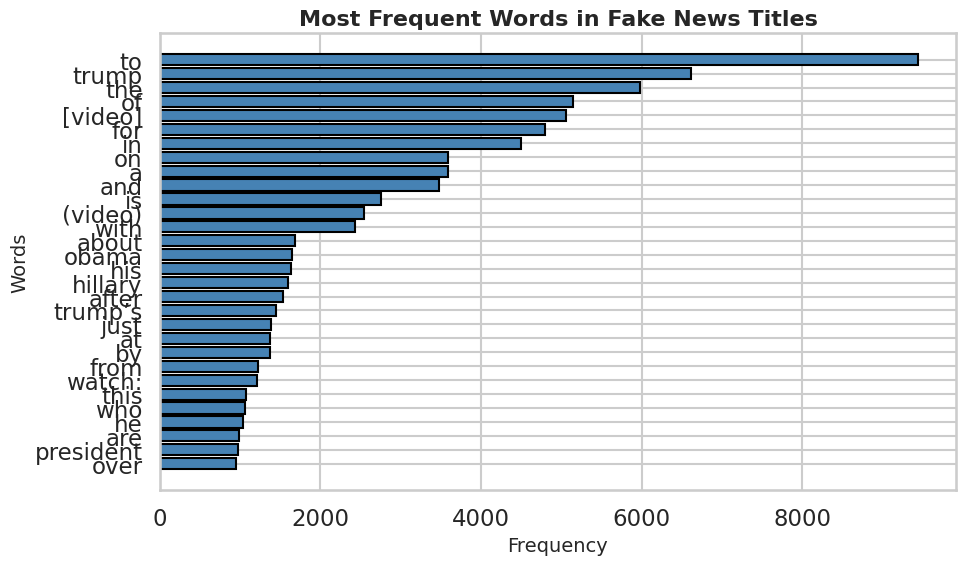

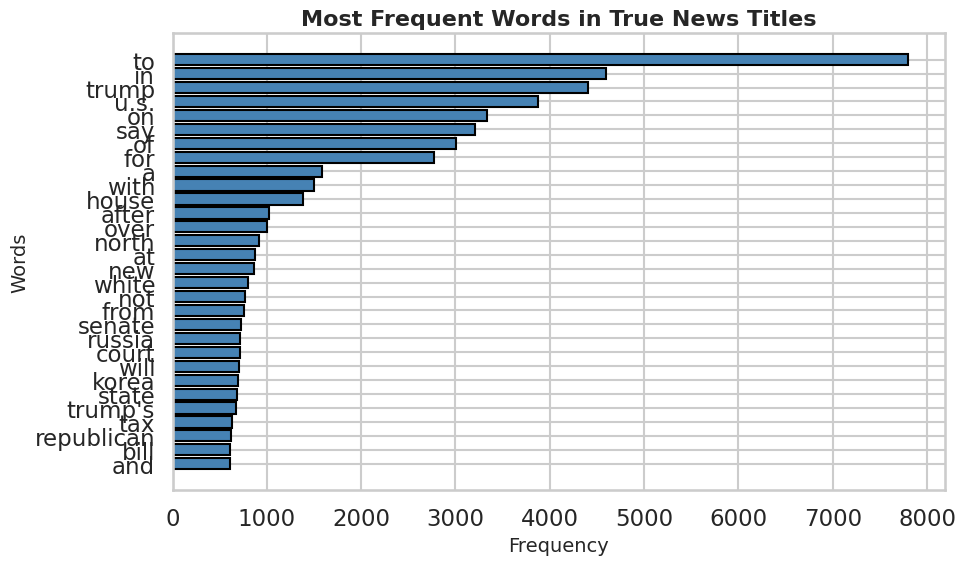

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_most_frequent_words(most_frequent_words, title):
    # Separate words and counts
    words, counts = zip(*most_frequent_words)

    # Use a Seaborn style
    sns.set_style("whitegrid")

    # Create figure
    plt.figure(figsize=(10, 6))

    # Plot horizontal bars
    plt.barh(words, counts, color="steelblue", edgecolor="black")

    # Labeling
    plt.xlabel("Frequency", fontsize=14)
    plt.ylabel("Words", fontsize=14)
    plt.title(title, fontsize=16, fontweight="bold")

    # Invert y-axis so highest frequency is at the top
    plt.gca().invert_yaxis()

    # Ensure everything fits without overlap
    plt.tight_layout()

    # Show the plot
    plt.show()
# Example usage:
plot_most_frequent_words(fake_news_frequent_words, "Most Frequent Words in Fake News Titles")
plot_most_frequent_words(true_news_frequent_words, "Most Frequent Words in True News Titles")


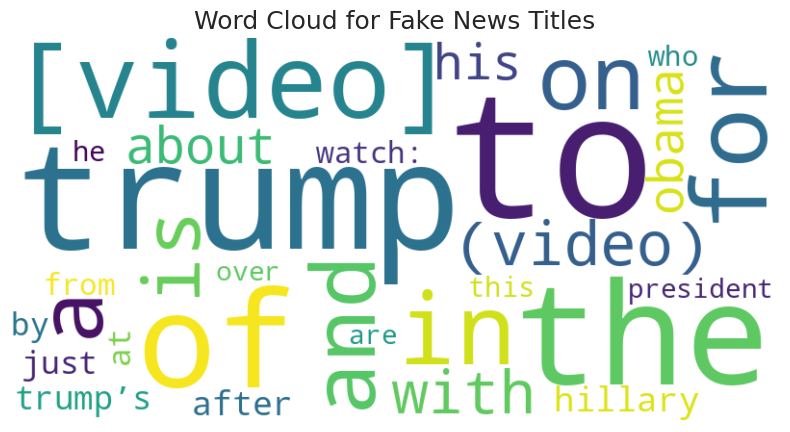

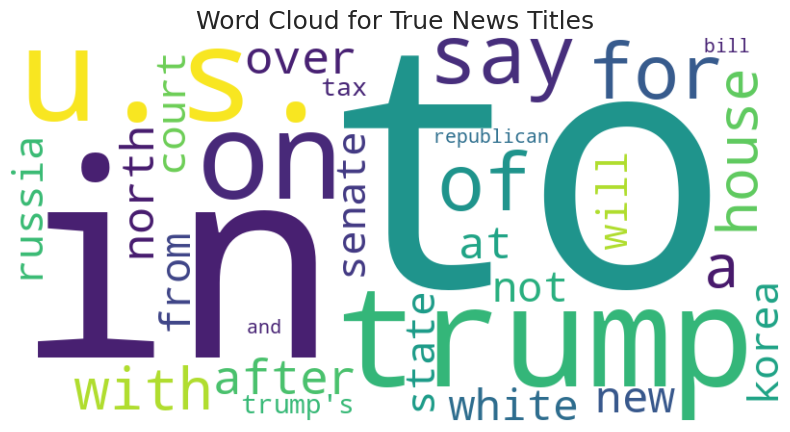

In [ ]:

from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Assuming 'fake_news_frequent_words' and 'true_news_frequent_words' are already defined

# Function to generate and display a word cloud
def plot_wordcloud(word_counts, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(dict(word_counts))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()


# Generate and display word clouds
plot_wordcloud(fake_news_frequent_words, "Word Cloud for Fake News Titles")
plot_wordcloud(true_news_frequent_words, "Word Cloud for True News Titles")


Lift Matrix (top 50 words):

             america  american   anti  black  breaking  calls  campaign  \
america          NaN     1.825  0.713  0.969     0.336  0.673     0.215   
american       1.825       NaN  3.938  1.120     1.120  0.749     0.359   
anti           0.713     3.938    NaN  0.775     0.689  0.518     1.158   
black          0.969     1.120  0.775    NaN     0.936  1.935     0.619   
breaking       0.336     1.120  0.689  0.936       NaN  0.410     1.462   
calls          0.673     0.749  0.518  1.935     0.410    NaN     0.338   
campaign       0.215     0.359  1.158  0.619     1.462  0.338       NaN   
clinton        0.411     0.196  0.949  0.368     1.750  1.200     2.657   
cnn            0.493     0.309  0.640  0.774     0.387  1.938     1.487   
democrat       0.683     1.712  1.775  1.475     2.011  1.075     0.773   
democrats      0.877     0.586  0.405  0.894     0.206  0.414     0.132   
donald         0.945     1.381  0.364  0.464     0.402  0.991     1.426

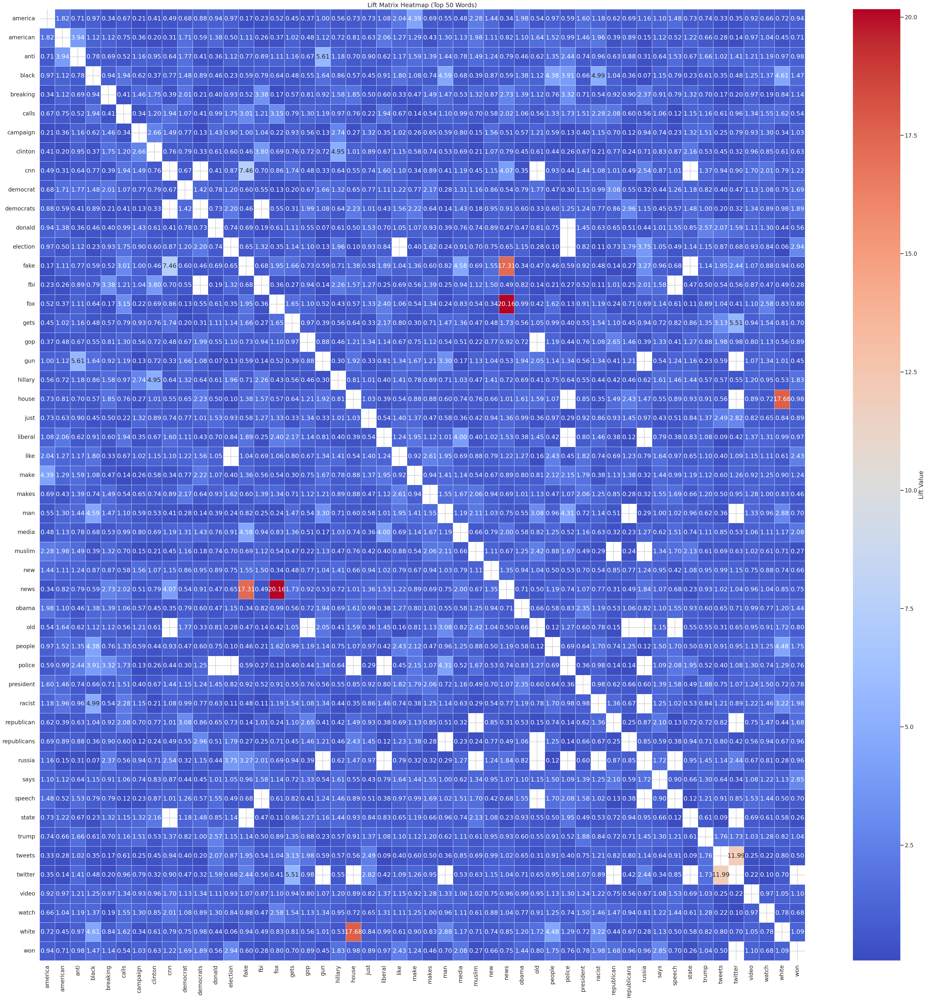

Lift Matrix (top 50 words):

             attack    ban  brexit  chief  china  clinton  congress  court  \
attack          NaN  0.313   0.119  0.995  0.464    1.028     0.140  0.971   
ban           0.313    NaN     NaN  0.776  0.745    0.099     0.350  6.142   
brexit        0.119    NaN     NaN    NaN    NaN    0.224       NaN  0.459   
chief         0.995  0.776     NaN    NaN  0.722    0.470     1.249  0.275   
china         0.464  0.745     NaN  0.722    NaN    0.083     1.036  0.146   
clinton       1.028  0.099   0.224  0.470  0.083      NaN     0.706  0.480   
congress      0.140  0.350     NaN  1.249  1.036    0.706       NaN  0.232   
court         0.971  6.142   0.459  0.275  0.146    0.480     0.232    NaN   
deal          0.088  0.109   6.717  0.782  0.602    0.442     1.273  0.339   
election      0.645  0.503   0.152  0.719  0.043    1.219     0.270  0.802   
eu              NaN  0.221  13.465  0.614  0.140    0.056     0.099  1.173   
factbox       0.248  0.618   1.170 

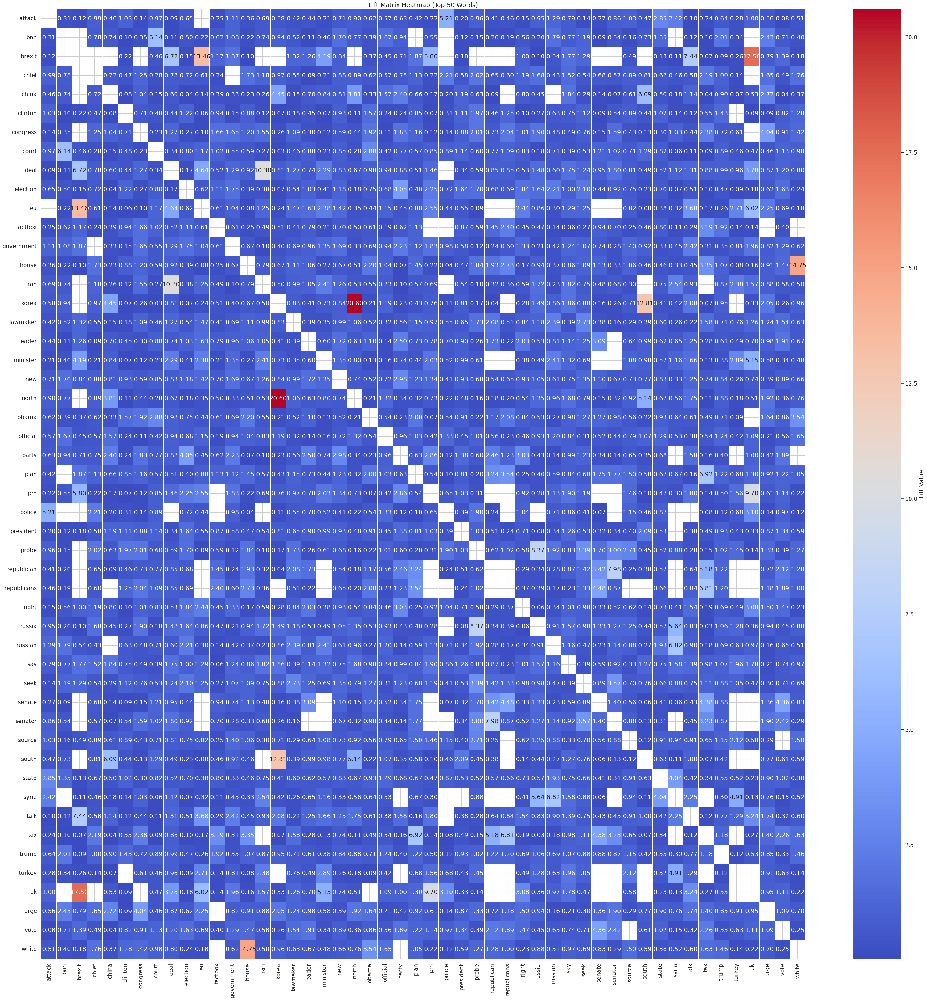

             america  american   anti  black  breaking  calls  campaign  \
america          NaN     1.825  0.713  0.969     0.336  0.673     0.215   
american       1.825       NaN  3.938  1.120     1.120  0.749     0.359   
anti           0.713     3.938    NaN  0.775     0.689  0.518     1.158   
black          0.969     1.120  0.775    NaN     0.936  1.935     0.619   
breaking       0.336     1.120  0.689  0.936       NaN  0.410     1.462   
calls          0.673     0.749  0.518  1.935     0.410    NaN     0.338   
campaign       0.215     0.359  1.158  0.619     1.462  0.338       NaN   
clinton        0.411     0.196  0.949  0.368     1.750  1.200     2.657   
cnn            0.493     0.309  0.640  0.774     0.387  1.938     1.487   
democrat       0.683     1.712  1.775  1.475     2.011  1.075     0.773   
democrats      0.877     0.586  0.405  0.894     0.206  0.414     0.132   
donald         0.945     1.381  0.364  0.464     0.402  0.991     1.426   
election       0.967     

In [ ]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer

def compute_and_plot_lift(reviews, top_n=20):

    # 1) Clean the text: lowercase and remove punctuation
    processed_reviews = [review.lower() for review in reviews]
    processed_reviews = [re.sub(r'\W+', ' ', rev) for rev in processed_reviews]

    # 2) Vectorize with CountVectorizer
    vectorizer = CountVectorizer(stop_words='english', max_features=top_n)
    X = vectorizer.fit_transform(processed_reviews)
    words = vectorizer.get_feature_names_out()

    # 3) Build co-occurrence matrix: each cell [i, j] = # of docs both word i & j appear in
    co_occurrence_matrix = (X.T * X).toarray()

    # 4) Zero out the diagonal (ignore self-co-occurrence)
    np.fill_diagonal(co_occurrence_matrix, 0)

    # 5) Compute word frequencies (# of docs each word appears in)
    word_frequencies = X.sum(axis=0).A1

    # 6) Expected co-occurrence assuming independence
    total_docs = X.shape[0]
    expected_co_occurrence_matrix = np.outer(word_frequencies, word_frequencies) / total_docs

    # 7) Lift = actual co-occurrence / expected co-occurrence
    #    (handle any division by zero issues by skipping or setting them to 0)
    lift_matrix = co_occurrence_matrix / expected_co_occurrence_matrix

    # 8) Convert to a DataFrame for easier handling
    lift_df = pd.DataFrame(lift_matrix, index=words, columns=words)
    lift_df.replace(0, np.nan, inplace=True)  # Replace 0 with NaN for clarity
    lift_df = lift_df.round(3)

    # Print the DataFrame
    print(f"Lift Matrix (top {top_n} words):\n")
    print(lift_df)

    # 9) Plot a heatmap of the lift matrix
    plt.figure(figsize=(50, 50))
    sns.heatmap(
        lift_df,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        linewidths=0.5,
        cbar_kws={'label': 'Lift Value'}
    )
    plt.title(f'Lift Matrix Heatmap (Top {top_n} Words)')
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.show()

    return lift_df
fake_title = compute_and_plot_lift(fake_news['title'], top_n=50)
true_title = compute_and_plot_lift(true_news['title'], top_n=50)
print(fake_title)
print(true_title)

In [ ]:
import numpy as np
import pandas as pd

def compute_dissimilarity_matrix(lift_df):

    # 1) Replace inf, -inf, and 0 with NaN
    lift_df_cleaned = lift_df.replace([np.inf, -np.inf, 0], np.nan)

    # 2) Compute dissimilarity as 1 / lift
    dissimilarity_matrix = 1 / lift_df_cleaned

    # 3) Replace NaN values with a large number => "maximum dissimilarity"
    max_dissimilarity = dissimilarity_matrix.max().max() * 2
    dissimilarity_matrix.fillna(max_dissimilarity, inplace=True)

    return dissimilarity_matrix
fake_diss = compute_dissimilarity_matrix(fake_title)
true_diss = compute_dissimilarity_matrix(true_title)
print(fake_diss)
print(true_diss)

               america   american       anti      black   breaking      calls  \
america      33.333333   0.547945   1.402525   1.031992   2.976190   1.485884   
american      0.547945  33.333333   0.253936   0.892857   0.892857   1.335113   
anti          1.402525   0.253936  33.333333   1.290323   1.451379   1.930502   
black         1.031992   0.892857   1.290323  33.333333   1.068376   0.516796   
breaking      2.976190   0.892857   1.451379   1.068376  33.333333   2.439024   
calls         1.485884   1.335113   1.930502   0.516796   2.439024  33.333333   
campaign      4.651163   2.785515   0.863558   1.615509   0.683995   2.958580   
clinton       2.433090   5.102041   1.053741   2.717391   0.571429   0.833333   
cnn           2.028398   3.236246   1.562500   1.291990   2.583979   0.515996   
democrat      1.464129   0.584112   0.563380   0.677966   0.497265   0.930233   
democrats     1.140251   1.706485   2.469136   1.118568   4.854369   2.415459   
donald        1.058201   0.7

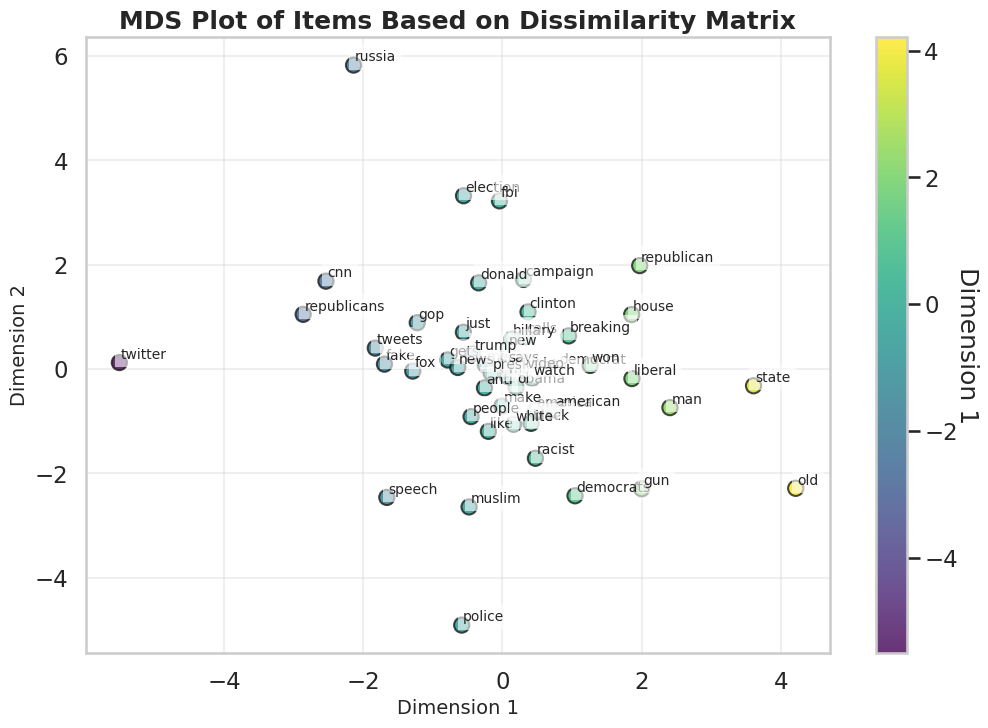

,Dimension 1,Dimension 2
america,0.469049,-0.805234
american,0.734693,-0.786659
anti,-0.258444,-0.362583
black,0.410522,-1.042794
breaking,0.950635,0.633944
calls,0.328164,0.608254
campaign,0.301570,1.716427
clinton,0.367286,1.093100
cnn,-2.537368,1.683853
democrat,0.800009,0.023677


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.manifold import MDS

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import MDS

def plot_mds_from_dissimilarity(dissimilarity_matrix, random_state=42):

    # Apply a Seaborn style and context for a clean look
    sns.set_style("whitegrid")
    sns.set_context("talk")

    # 1) Convert the DataFrame to a NumPy array
    dissimilarity_array = dissimilarity_matrix.values

    # 2) Apply MDS (using precomputed dissimilarities)
    mds = MDS(n_components=2, dissimilarity='precomputed', random_state=random_state)
    mds_coordinates = mds.fit_transform(dissimilarity_array)

    # 3) Create a DataFrame for the MDS results
    mds_df = pd.DataFrame(
        mds_coordinates,
        columns=['Dimension 1', 'Dimension 2'],
        index=dissimilarity_matrix.index
    )

    # 4) Plot the MDS result
    plt.figure(figsize=(12, 8))

    # Use the first dimension to color the points (c=mds_df['Dimension 1'])
    sc = plt.scatter(
        mds_df['Dimension 1'],
        mds_df['Dimension 2'],
        s=120,
        c=mds_df['Dimension 1'],
        cmap='viridis',  # try "plasma", "coolwarm", etc.
        alpha=0.8,
        edgecolors='k'
    )

    # Add a color bar indicating Dimension 1 values
    cbar = plt.colorbar(sc)
    cbar.set_label('Dimension 1', rotation=270, labelpad=15)

    # Offset the text labels slightly and use a translucent background
    for label, (x, y) in mds_df.iterrows():
        plt.text(
            x + 0.02, y + 0.02, label, fontsize=10,
            ha='left', va='bottom',
            bbox=dict(facecolor='white', alpha=0.6, edgecolor='none')
        )

    plt.title('MDS Plot of Items Based on Dissimilarity Matrix', fontsize=18, fontweight='bold')
    plt.xlabel('Dimension 1', fontsize=14)
    plt.ylabel('Dimension 2', fontsize=14)
    plt.grid(True, alpha=0.3)

    plt.show()
    return mds_df

plot_mds_from_dissimilarity(fake_diss)

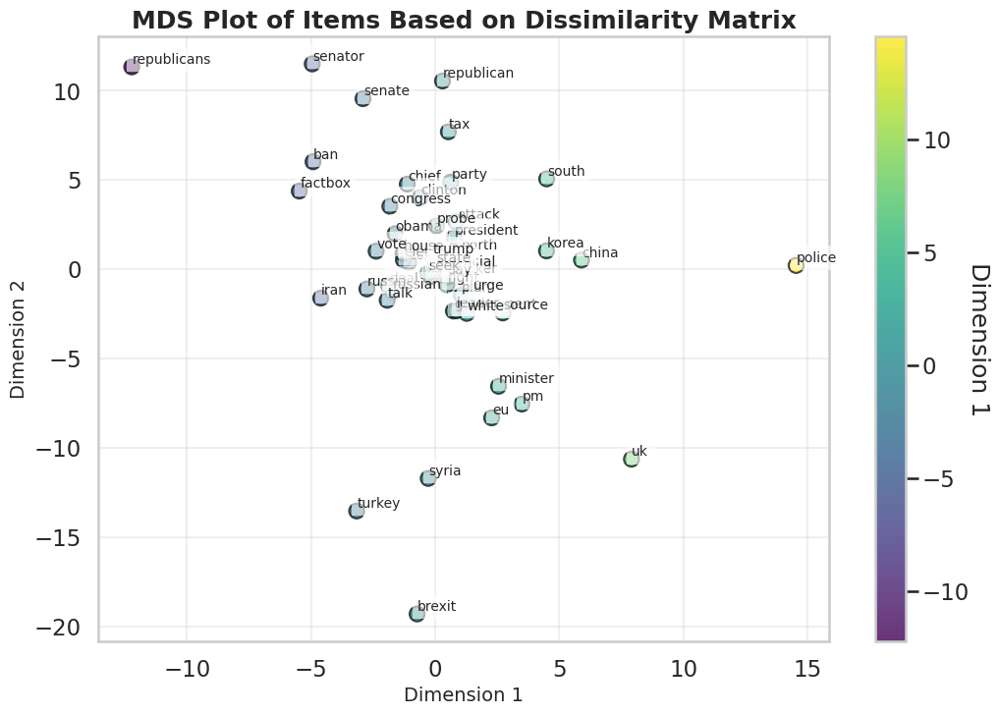

,Dimension 1,Dimension 2
attack,0.845077,2.654479
ban,-4.925709,6.019524
brexit,-0.731101,-19.302550
chief,-1.128844,4.766424
china,5.892069,0.515340
clinton,-0.612169,4.017215
congress,-1.830821,3.527746
court,-1.068244,0.399480
deal,-1.887209,-0.915845
election,-1.285325,0.523715


In [ ]:
plot_mds_from_dissimilarity(true_diss)

### **2.3 Data Visualization For Text column**

In [ ]:
# Get most frequent words in 'title' for fake news
fake_news_frequent_words_text = get_most_frequent_words(fake_news, 'text')
print("Most frequent words in fake news texts:", fake_news_frequent_words)

# Get most frequent words in 'title' for true news
true_news_frequent_words_text = get_most_frequent_words(true_news, 'text')
print("Most frequent words in true news texts:", true_news_frequent_words)

Most frequent words in fake news texts: [('to', 9443), ('trump', 6615), ('the', 5978), ('of', 5141), ('[video]', 5054), ('for', 4793), ('in', 4493), ('on', 3594), ('a', 3592), ('and', 3482), ('is', 2757), ('(video)', 2543), ('with', 2435), ('about', 1688), ('obama', 1645), ('his', 1628), ('hillary', 1591), ('after', 1529), ('trump’s', 1450), ('just', 1388), ('at', 1373), ('by', 1372), ('from', 1222), ('watch:', 1212), ('this', 1074), ('who', 1055), ('he', 1033), ('are', 984), ('president', 971), ('over', 946)]
Most frequent words in true news texts: [('to', 7798), ('in', 4591), ('trump', 4405), ('u.s.', 3872), ('on', 3333), ('say', 3210), ('of', 3009), ('for', 2770), ('a', 1582), ('with', 1496), ('house', 1386), ('after', 1023), ('over', 1002), ('north', 920), ('at', 873), ('new', 860), ('white', 804), ('not', 763), ('from', 760), ('senate', 726), ('russia', 718), ('court', 711), ('will', 709), ('korea', 695), ('state', 680), ("trump's", 669), ('tax', 633), ('republican', 624), ('bill'

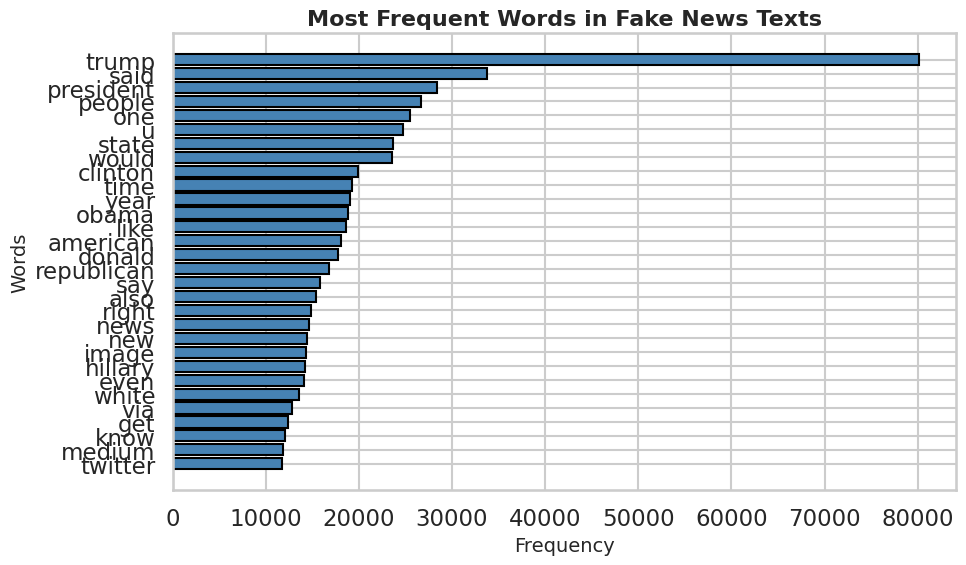

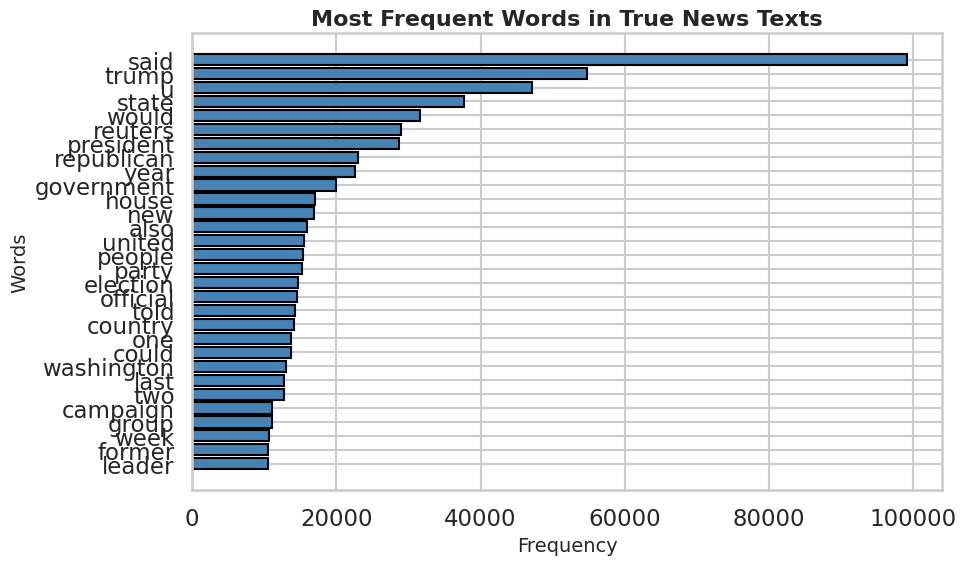

In [ ]:
plot_most_frequent_words(fake_news_frequent_words_text, "Most Frequent Words in Fake News Texts")
plot_most_frequent_words(true_news_frequent_words_text, "Most Frequent Words in True News Texts")

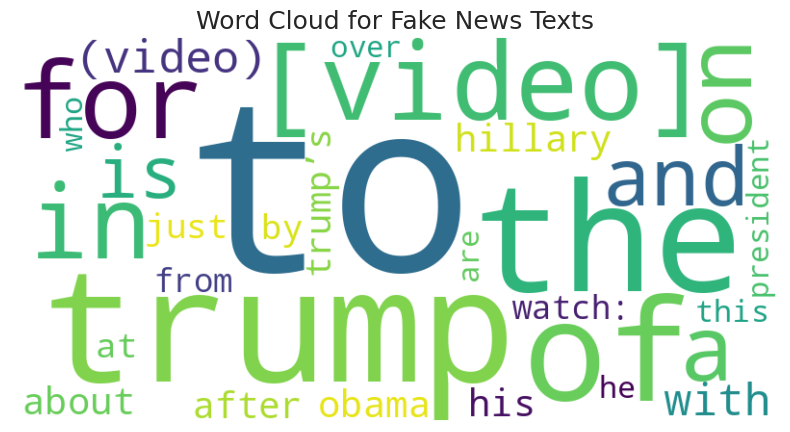

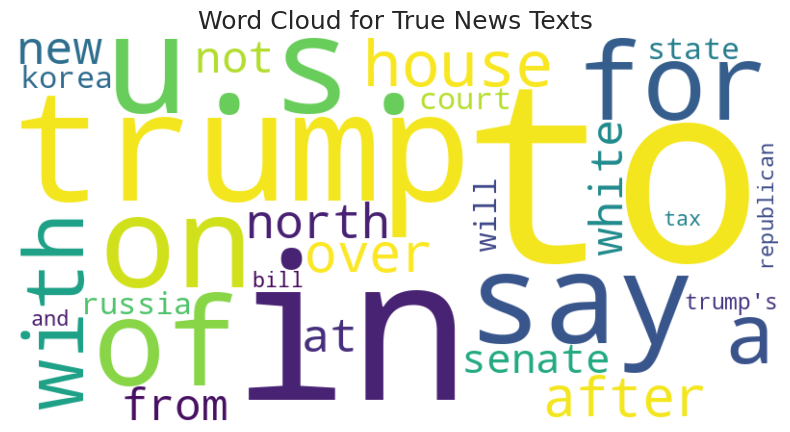

In [ ]:
plot_wordcloud(fake_news_frequent_words, "Word Cloud for Fake News Texts")
plot_wordcloud(true_news_frequent_words, "Word Cloud for True News Texts")

Lift Matrix (top 50 words):

            according  america  american  black  campaign  clinton    com  \
according         NaN    1.763     1.618  1.542     1.954    2.314  1.204   
america         1.763      NaN     3.927  2.376     1.991    1.621  1.115   
american        1.618    3.927       NaN  2.132     1.795    1.475  1.152   
black           1.542    2.376     2.132    NaN     1.091    0.948  1.357   
campaign        1.954    1.991     1.795  1.091       NaN    3.924  1.037   
clinton         2.314    1.621     1.475  0.948     3.924      NaN  1.110   
com             1.204    1.115     1.152  1.357     1.037    1.110    NaN   
come            1.497    1.746     1.637  1.340     1.483    1.623  1.095   
country         1.552    2.954     2.631  1.136     1.347    1.428  0.875   
day             1.967    1.768     1.701  1.414     1.632    1.768  1.377   
donald          1.001    1.519     1.390  0.989     2.011    1.464  1.383   
election        1.753    2.005     1.880  1.203

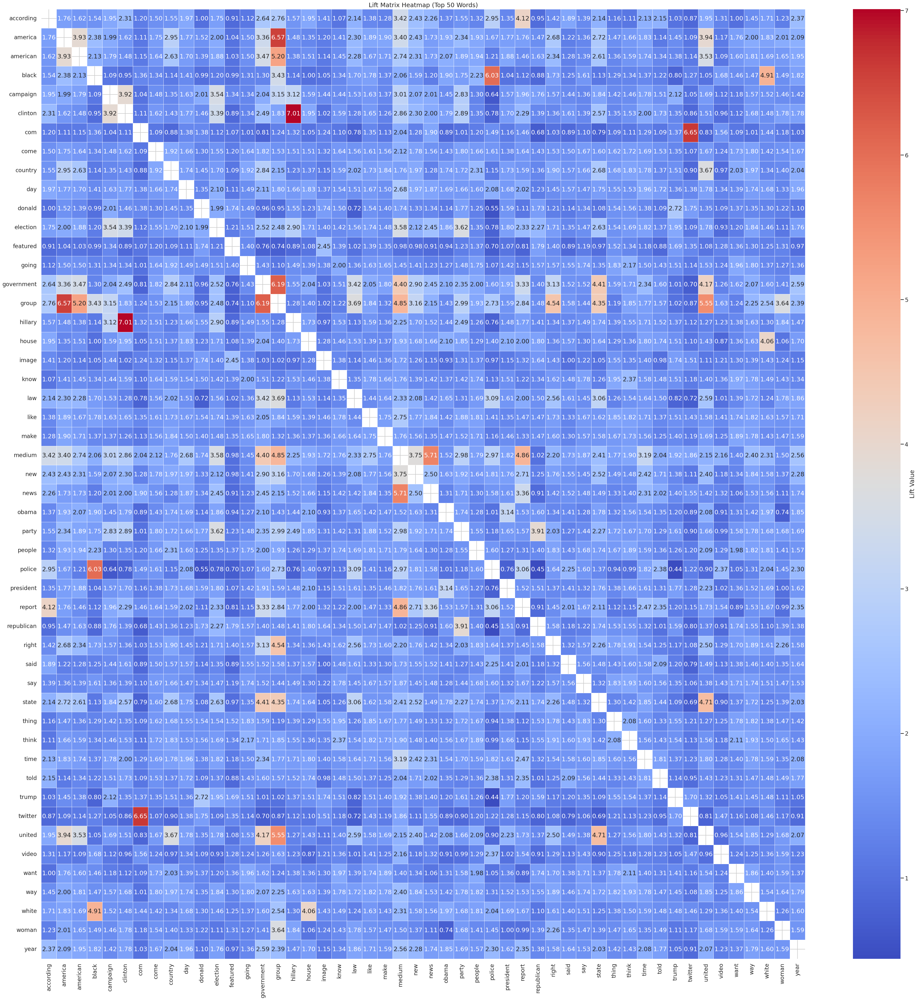

Lift Matrix (top 50 words):

                administration  campaign  china  clinton  country  court  \
administration             NaN     1.386  1.962    0.855    1.516  2.351   
campaign                 1.386       NaN  0.740    5.891    1.095  1.008   
china                    1.962     0.740    NaN    0.539    2.411  0.308   
clinton                  0.855     5.891  0.539      NaN    0.976  0.655   
country                  1.516     1.095  2.411    0.976      NaN  1.396   
court                    2.351     1.008  0.308    0.655    1.396    NaN   
day                      1.517     1.651  1.167    1.875    1.508  1.606   
democratic               1.495     3.091  0.644    5.526    0.945  1.772   
donald                   1.661     2.120  1.315    2.441    1.090  0.946   
election                 0.904     2.938  0.543    3.142    1.167  1.673   
foreign                  1.705     1.458  3.308    1.116    1.891  0.594   
government               1.295     0.979  1.051    0.764   

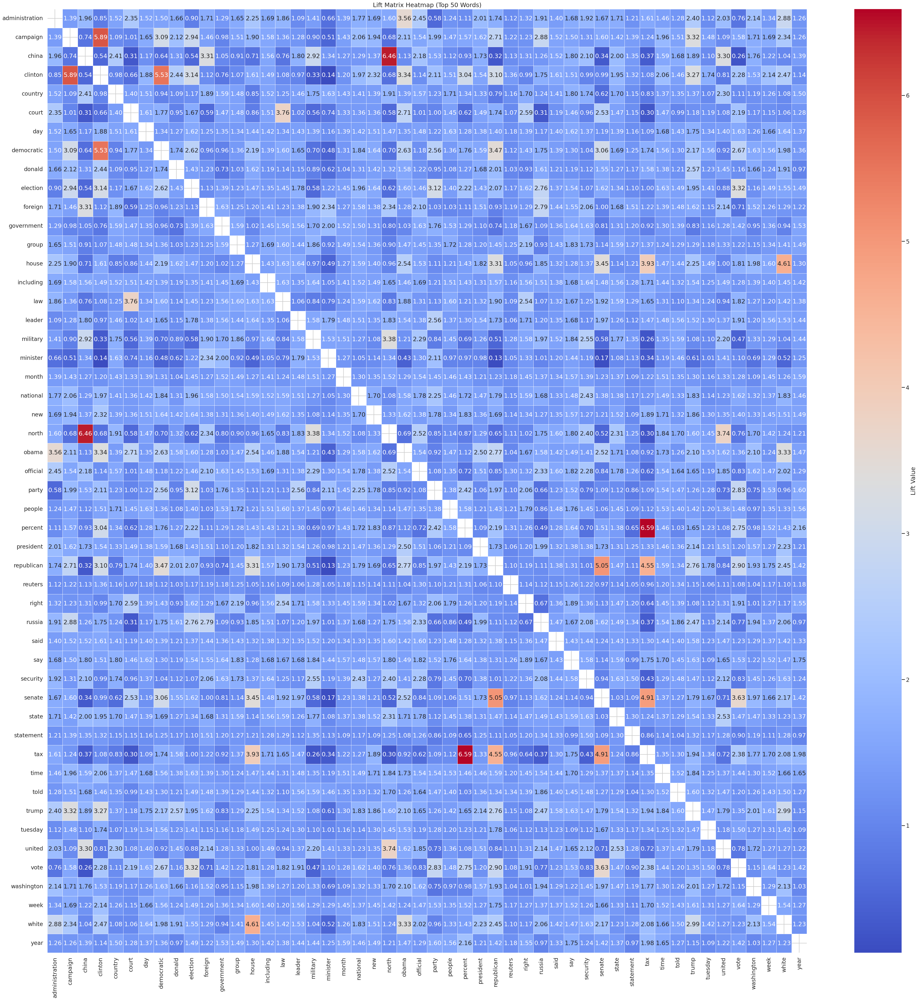

            according  america  american  black  campaign  clinton    com  \
according         NaN    1.763     1.618  1.542     1.954    2.314  1.204   
america         1.763      NaN     3.927  2.376     1.991    1.621  1.115   
american        1.618    3.927       NaN  2.132     1.795    1.475  1.152   
black           1.542    2.376     2.132    NaN     1.091    0.948  1.357   
campaign        1.954    1.991     1.795  1.091       NaN    3.924  1.037   
clinton         2.314    1.621     1.475  0.948     3.924      NaN  1.110   
com             1.204    1.115     1.152  1.357     1.037    1.110    NaN   
come            1.497    1.746     1.637  1.340     1.483    1.623  1.095   
country         1.552    2.954     2.631  1.136     1.347    1.428  0.875   
day             1.967    1.768     1.701  1.414     1.632    1.768  1.377   
donald          1.001    1.519     1.390  0.989     2.011    1.464  1.383   
election        1.753    2.005     1.880  1.203     3.540    3.386  1.116   

In [ ]:
fake_text = compute_and_plot_lift(fake_news['text'], top_n=50)
true_text = compute_and_plot_lift(true_news['text'], top_n=50)
print(fake_text)
print(true_text)

In [ ]:
fake_diss_text = compute_dissimilarity_matrix(fake_text)
true_diss_text = compute_dissimilarity_matrix(true_text)
print(fake_diss_text)
print(true_diss_text)

            according   america  american     black  campaign   clinton  \
according    4.535147  0.567215  0.618047  0.648508  0.511771  0.432152   
america      0.567215  4.535147  0.254647  0.420875  0.502260  0.616903   
american     0.618047  0.254647  4.535147  0.469043  0.557103  0.677966   
black        0.648508  0.420875  0.469043  4.535147  0.916590  1.054852   
campaign     0.511771  0.502260  0.557103  0.916590  4.535147  0.254842   
clinton      0.432152  0.616903  0.677966  1.054852  0.254842  4.535147   
com          0.830565  0.896861  0.868056  0.736920  0.964320  0.900901   
come         0.668003  0.572738  0.610874  0.746269  0.674309  0.616143   
country      0.644330  0.338524  0.380084  0.880282  0.742390  0.700280   
day          0.508388  0.565611  0.587889  0.707214  0.612745  0.565611   
donald       0.999001  0.658328  0.719424  1.011122  0.497265  0.683060   
election     0.570451  0.498753  0.531915  0.831255  0.282486  0.295334   
featured     1.096491  0.

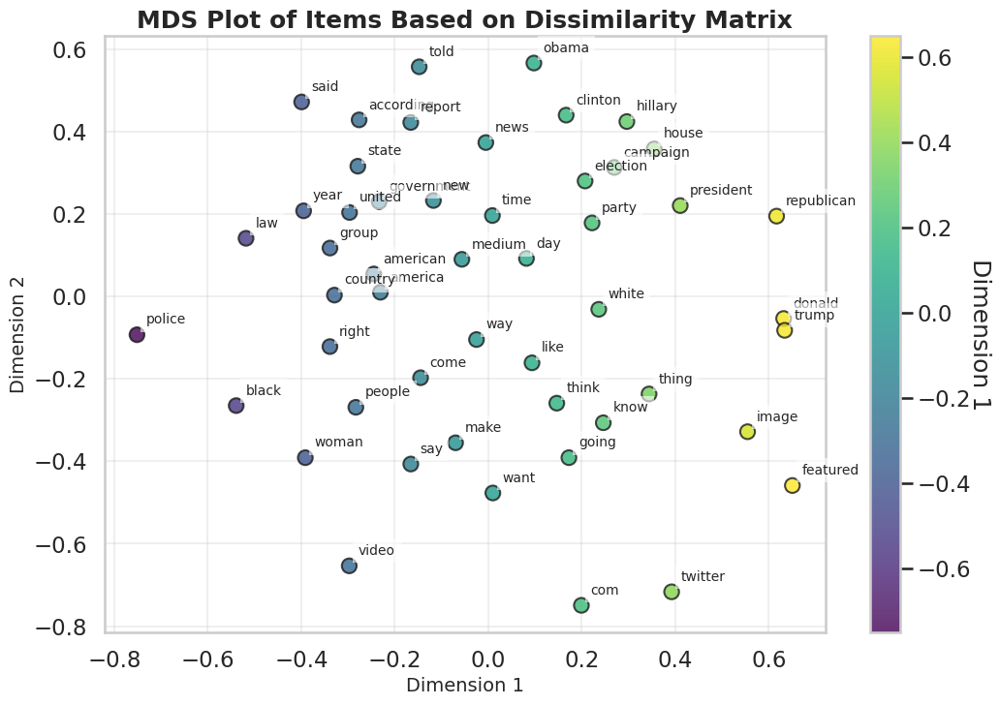

,Dimension 1,Dimension 2
according,-0.276261,0.428033
america,-0.230615,0.009837
american,-0.244916,0.054197
black,-0.539095,-0.265138
campaign,0.269528,0.312632
clinton,0.166509,0.439508
com,0.199073,-0.749664
come,-0.144814,-0.197517
country,-0.329033,0.002942
day,0.081594,0.091929


In [ ]:
plot_mds_from_dissimilarity(fake_diss_text)

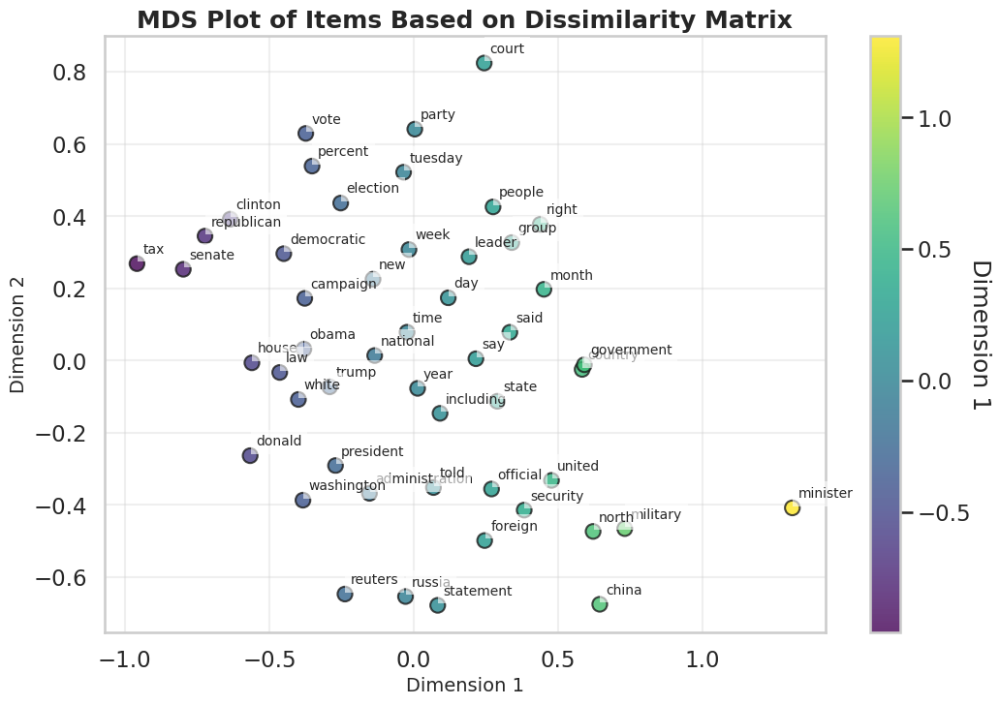

,Dimension 1,Dimension 2
administration,-0.153346,-0.367719
campaign,-0.377295,0.172432
china,0.643856,-0.675038
clinton,-0.635143,0.391860
country,0.582830,-0.024330
court,0.243779,0.824400
day,0.119403,0.173896
democratic,-0.449890,0.296283
donald,-0.566314,-0.263363
election,-0.252873,0.436475


In [ ]:
plot_mds_from_dissimilarity(true_diss_text)

### **2.4 Insights draw from the Data Visualization and compare between title and text**

#### **Fake titles vs true titles**


Both fake and true news titles tend to use similar core vocabulary—terms like america, black, breaking, clinton, trump, and hillary are common to both. However, a close look at the lift matrices reveals some notable differences in how these words co-occur:

* Exaggerated Pairings in Fake Titles:

In the fake news lift matrix, several word pairs show markedly higher lift values. For example, the fake titles include the token fake itself and it frequently co-occurs with other sensational or politically charged terms at extremely high values. Similarly, the associations among political names (such as clinton with hillary or trump with donald) are often amplified in fake titles. This suggests that fake news headlines deliberately intensify these associations to heighten emotional impact and draw attention.
* Media and Partisan Cues:

Fake news titles also tend to strongly link media-related words (like cnn and fox) with political figures, reinforcing partisan narratives. In contrast, while true news titles also reference these media terms, the corresponding lift values are generally more moderate, indicating a more balanced or less sensational framing.
* Overall Intensity and Narrative Focus:

Although both types of news share a similar set of frequent words, the intensity of co-occurrence (as captured by lift values) is consistently higher in fake titles. This suggests that fake news may be purposefully constructed to exaggerate connections among key terms. True news titles, on the other hand, show a more measured pattern of associations that likely reflects a broader and less ideologically charged approach to headline construction.


#### **True text vs fake text**


The text patterns show a similar trend to titles:

* Core Vocabulary Consistency:
Both datasets frequently use politically charged words such as trump, obama, clinton, hillary, and terms denoting immediacy like breaking, news, and video. Their overall lift matrices are strikingly similar, indicating that the surface-level language in headlines is quite consistent across true and fake news.

* Slight Variations in Associations:

	* The co-occurrence strength between clinton and hillary is very high in both cases; however, the true news titles matrix shows a lift of about 4.82 compared to slightly higher values (around 5.08) in fake news titles. This suggests that fake news headlines might be designed to amplify associations even further to draw more attention.
	* Other associations (e.g., between trump and donald) are also very close, with fake news slightly edging out true news in terms of intensity.
	* Racial/identity markers like black and white appear strongly in both matrices (with lift values above 4), indicating that both types of news leverage these terms, though the marginally higher value in fake news may hint at a deliberate emphasis on polarizing language.

* Implications for Detection
	* Headline Similarity Challenges:

	Since both fake and true news titles use similar terms and exhibit comparable co-occurrence patterns, relying solely on headline features might make it difficult to distinguish between the two.

	* Deeper Textual Patterns as Signals:

	The subtle but consistent differences in text lift values—particularly the more intense coupling of politically charged words in fake news—suggest that analyzing the body content could provide additional discriminative power for detection models.

### **2.5 Unsupervised Learning to cluster subjects of the news**
Our initial exploration of the dataset revealed a notable difference between the subjects covered by true and fake news. Specifically, true news articles are primarily categorized as politicsnews and worldnews, whereas fake news spans a wider variety of subjects. This discrepancy motivates a more detailed, segmented analysis.

In [ ]:
#!pip install nltk
import nltk
nltk.download('punkt_tab') # Download the punkt_tab data package
nltk.download('stopwords')
nltk.download('punkt')


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string

In [ ]:
# Define a preprocessing function:
def preprocess_text(text):
    # Ensure the text is a string and convert to lowercase
    text = str(text).lower()
    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    # Tokenize the text
    tokens = word_tokenize(text)
    # Remove stopwords (common words)
    filtered_tokens = [word for word in tokens if word not in stopwords.words('english')]
    return " ".join(filtered_tokens)
# Apply the preprocessing function to the title and text columns
fake_news['title_processed'] = fake_news['title'].apply(preprocess_text)
fake_news['text_processed'] = fake_news['text'].apply(preprocess_text)


In [ ]:
true_news['title_processed'] = true_news['title'].apply(preprocess_text)
true_news['text_processed'] = true_news['text'].apply(preprocess_text)

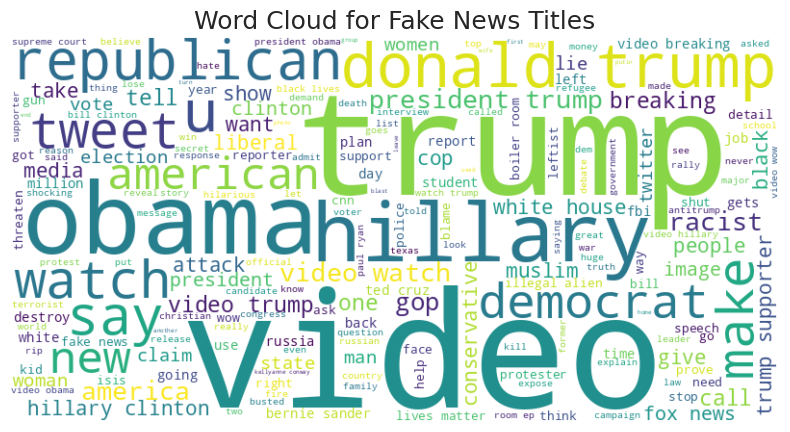

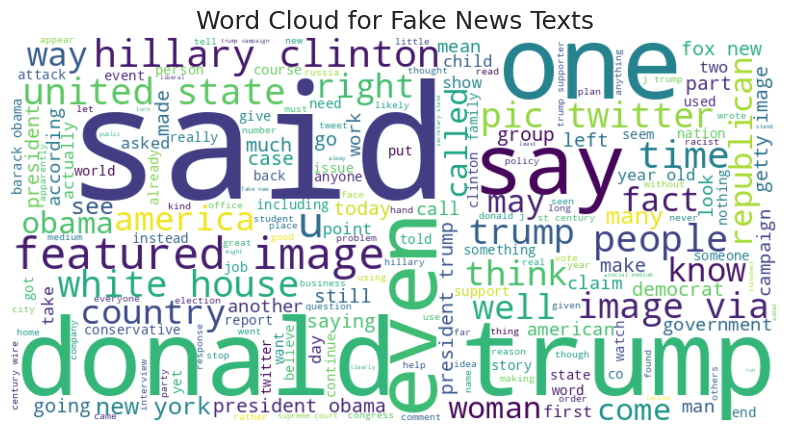

In [ ]:
# Create a combined string for titles and texts respectively
all_titles = " ".join(fake_news['title_processed'].tolist())
all_texts = " ".join(fake_news['text_processed'].tolist())

# Generate and display the word cloud for titles
wordcloud_titles = WordCloud(width=800, height=400, background_color='white').generate(all_titles)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_titles, interpolation='bilinear')
plt.title("Word Cloud for Fake News Titles")
plt.axis("off")
plt.show()

# Generate and display the word cloud for texts
wordcloud_texts = WordCloud(width=800, height=400, background_color='white').generate(all_texts)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_texts, interpolation='bilinear')
plt.title("Word Cloud for Fake News Texts")
plt.axis("off")
plt.show()

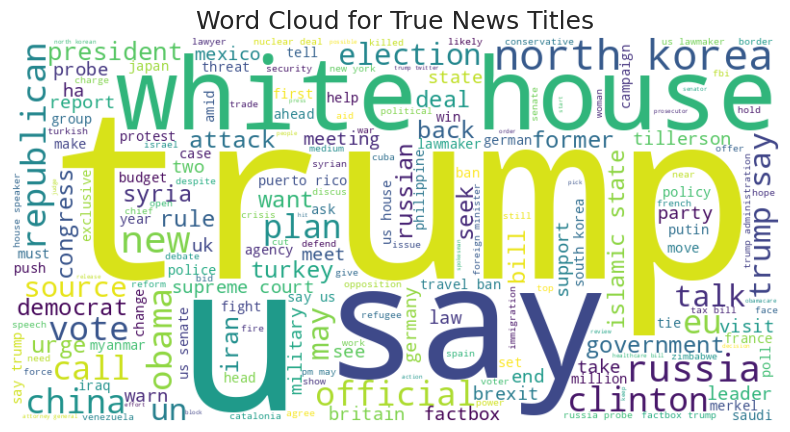

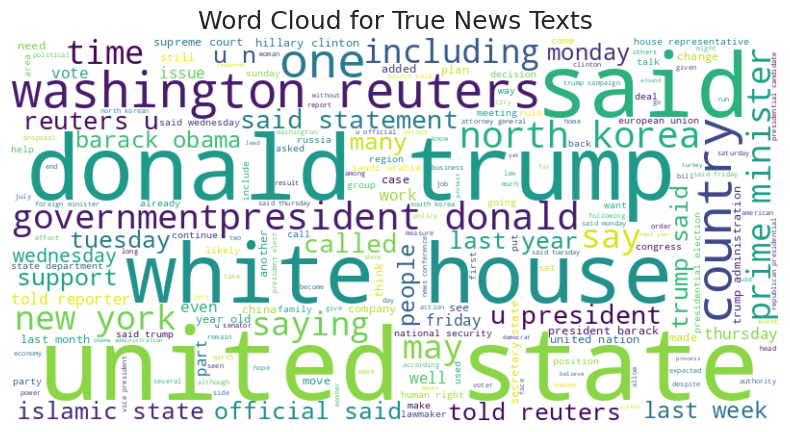

In [ ]:
# Create a combined string for titles and texts respectively
true_titles = " ".join(true_news['title_processed'].tolist())
true_texts = " ".join(true_news['text_processed'].tolist())

# Generate and display the word cloud for titles
wordcloud_titles = WordCloud(width=800, height=400, background_color='white').generate(true_titles)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_titles, interpolation='bilinear')
plt.title("Word Cloud for True News Titles")
plt.axis("off")
plt.show()

# Generate and display the word cloud for texts
wordcloud_texts = WordCloud(width=800, height=400, background_color='white').generate(true_texts)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_texts, interpolation='bilinear')
plt.title("Word Cloud for True News Texts")
plt.axis("off")
plt.show()

In [ ]:
from sklearn.decomposition import LatentDirichletAllocation
# ------------------------------
# Unsupervised Clustering for Titles and Texts Separately
# ------------------------------

#LDA Title comparison
vectorizer = CountVectorizer(stop_words='english', max_df=0.95, min_df=2)
title_fake = vectorizer.fit_transform(fake_news['title_processed'])

n_topics = 5  # adjust the number of topics as desired
lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
lda.fit(title_fake)

n_top_words = 10
feature_names = vectorizer.get_feature_names_out()
print("Fake Title Clustering:")
for topic_idx, topic in enumerate(lda.components_):
    print(f"Topic {topic_idx + 1}:")
    top_words = [feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]
    print(" ".join(top_words))
    print()


vectorizer = CountVectorizer(stop_words='english', max_df=0.95, min_df=2)
title_true = vectorizer.fit_transform(true_news['title_processed'])

n_topics = 5  # adjust the number of topics as desired
lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
lda.fit(title_true)

n_top_words = 10
feature_names = vectorizer.get_feature_names_out()
print("True Title Clustering:")
for topic_idx, topic in enumerate(lda.components_):
    print(f"Topic {topic_idx + 1}:")
    top_words = [feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]
    print(" ".join(top_words))
    print()





Fake Title Clustering:
Topic 1:
trump hillary clinton fbi video breaking russia state obama comey

Topic 2:
video trump black obama hillary news police media breaking watch

Topic 3:
video trump obama watch bernie sanders hillary new america iran

Topic 4:
trump video gop obama watch hillary president muslim tweets donald

Topic 5:
trump video president watch donald obama cruz white news house

True Title Clustering:
Topic 1:
trump say north korea china trumps iran republican south white

Topic 2:
trump say eu election brexit talk ban uk new deal

Topic 3:
court say police opposition attack leader minister saudi kill pm

Topic 4:
house trump senate tax say white probe republicans reform healthcare

Topic 5:
state say russia syria plan trump republican clinton islamic house



### 2.5.1 Insights on Title Clusters

Fake News:

* Sensational Multimedia Cues:

Nearly every fake news cluster starts **with** or prominently features the term “video”, indicating a strong reliance on multimedia imagery to grab attention. This is paired with hyperbolic language—words like “fake”, “breaking”, and “tweets”.

* Overemphasis on Political Figures:

cross all fake clusters, key names such as “trump”, “obama”, “hillary”, and “clinton” appear repeatedly. In several clusters, these names are combined with each other

* Narrow, Controversial Focus:
The fake titles largely concentrate on sensational, politically charged topics with little additional context. T

True News:
* True news clusters include more context-specific terms such as “pm”, “china”, “brexit”, “border minister”, “tax”, “senate”, “court”, and “travel”. These words indicate a focus on concrete events
* Although political names like “trump”, “clinton”, and “obama” still appear, they are embedded within headlines that refer to legislative or diplomatic processes (e.g., “house trump white republican tax senate clinton says vote obama”).
* True titles often mention international issues and geopolitical events—such as “north korea”, “russia”, “syria”, “sanctions”, “myanmar”, “rohingya”, and “german talks”

In [ ]:
#LDA Text Comparison
vvectorizer = CountVectorizer(stop_words='english', max_df=0.95, min_df=2)
text_fake = vectorizer.fit_transform(fake_news['text_processed'])

n_topics = 5  # adjust the number of topics as desired
lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
lda.fit(text_fake)

n_top_words = 10
feature_names = vectorizer.get_feature_names_out()
print("Fake Text Clustering:")
for topic_idx, topic in enumerate(lda.components_):
    print(f"Topic {topic_idx + 1}:")
    top_words = [feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]
    print(" ".join(top_words))
    print()


vectorizer = CountVectorizer(stop_words='english', max_df=0.95, min_df=2)
text_true = vectorizer.fit_transform(true_news['text_processed'])

n_topics = 5  # adjust the number of topics as desired
lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
lda.fit(text_true)

n_top_words = 10
feature_names = vectorizer.get_feature_names_out()
print("True text Clustering:")
for topic_idx, topic in enumerate(lda.components_):
    print(f"Topic {topic_idx + 1}:")
    top_words = [feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]
    print(" ".join(top_words))
    print()

Fake Text Clustering:
Topic 1:
trump donald president people image said like twitter republican know

Topic 2:
clinton hillary republican vote state said election party democrat woman

Topic 3:
clinton fbi news russian medium email said investigation russia story

Topic 4:
said police people black year gun life school right officer

Topic 5:
state american obama year government country president said people united

True text Clustering:
Topic 1:
said state north united china korea military force official country

Topic 2:
said state trade government eu company deal year billion trump

Topic 3:
trump said republican tax house state clinton president senate year

Topic 4:
trump said president state house russia washington russian official white

Topic 5:
said party court government year election right people state country



### 2.5.2 Insights on Text Clusters

Fake news:

* Many of the fake text topics heavily feature key political names such as trump, donald, president, obama, clinton, hillary, and republican(s). This repetition suggests that fake news texts tend to revolve around a narrow set of political figures and issues

* Clusters include generic markers like said, people, states, and news alongside polarizing topics. For example, Topic 5 pairs clinton, hillary, fbi, state, russian, government, president, campaig

* Other fake text topics focus on specific contentious themes such as immigration (Topic 2: mentioning school, students, immigration, border, illegal) and law enforcement or racial tension (Topic 4: with words like police, black, gun, law, city).

True news:
* True news clusters incorporate a wider range of topics. For instance, Topic 1 mentions international actors like north korea, china, eu, minister, european, and states
* True topics mix domestic political elements with broader policy and economic context. Topic 2, for example, mentions president, government, states, trump, united, trade, court, mexico, year, suggesting a report that connects U.S. political leadership with international trade and legal issues.
* True text clusters tend to include context-specific words such as trade, court, minister, united, and coalition, providing readers with a richer context that supports more nuanced understanding of events.

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer # Import TfidfVectorizer
from sklearn.cluster import KMeans

In [ ]:
#Kmeans title comparison
# Vectorize the titles using TF-IDF
tfidf_vectorizer_titles = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
X_titles = tfidf_vectorizer_titles.fit_transform(fake_news['title_processed'])

# Choose number of clusters (e.g., 5 clusters)
n_clusters_titles = 5
kmeans_titles = KMeans(n_clusters=n_clusters_titles, random_state=42)
kmeans_titles.fit(X_titles)

print("Fake Title Clustering:")
order_centroids_titles = kmeans_titles.cluster_centers_.argsort()[:, ::-1]
terms_titles = tfidf_vectorizer_titles.get_feature_names_out()

for i in range(n_clusters_titles):
    top_terms = [terms_titles[ind] for ind in order_centroids_titles[i, :10]]
    print(f"Cluster {i+1}: " + " ".join(top_terms))

# Optionally, you can assign the cluster labels back to the DataFrame:
fake_news['title_cluster'] = kmeans_titles.labels_


# Vectorize the titles using TF-IDF
tfidf_vectorizer_titles = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
X_titles_true = tfidf_vectorizer_titles.fit_transform(true_news['title_processed'])

# Choose number of clusters (e.g., 5 clusters)
n_clusters_titles = 5
kmeans_titles = KMeans(n_clusters=n_clusters_titles, random_state=42)
kmeans_titles.fit(X_titles_true)

print("True Title Clustering:")
order_centroids_titles = kmeans_titles.cluster_centers_.argsort()[:, ::-1]
terms_titles = tfidf_vectorizer_titles.get_feature_names_out()

for i in range(n_clusters_titles):
    top_terms = [terms_titles[ind] for ind in order_centroids_titles[i, :10]]
    print(f"Cluster {i+1}: " + " ".join(top_terms))

# Optionally, you can assign the cluster labels back to the DataFrame:
true_news['title_cluster'] = kmeans_titles.labels_



Fake Title Clustering:
Cluster 1: news fox fake video trump host watch bad cnn breaking
Cluster 2: video obama black white watch president trump house america breaking
Cluster 3: trump video watch donald president tweets gop new media gets
Cluster 4: left reason crazy trump video goes watch gives real hilarious
Cluster 5: hillary clinton video trump emails fbi watch email campaign breaking
True Title Clustering:
Cluster 1: trump house white administration clinton factbox republican tax official twitter
Cluster 2: state islamic department syria trump secretary say tillerson syrian attack
Cluster 3: house trumps new senate court north vote russia korea election
Cluster 4: say trump korea north china russia deal house pm iran
Cluster 5: leader catalan senate say opposition trump house new democratic meet


In [ ]:
#K-means text comparison

# ------------------------------
# Clustering on Texts
# ------------------------------

# Vectorize the text column using TF-IDF
tfidf_vectorizer_text = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
X_text = tfidf_vectorizer_text.fit_transform(fake_news['text_processed'])

# Choose number of clusters (e.g., 5 clusters)
n_clusters_text = 5
kmeans_text = KMeans(n_clusters=n_clusters_text, random_state=42)
kmeans_text.fit(X_text)

print("\nFake Text Clustering:")
order_centroids_text = kmeans_text.cluster_centers_.argsort()[:, ::-1]
terms_text = tfidf_vectorizer_text.get_feature_names_out()

for i in range(n_clusters_text):
    top_terms_text = [terms_text[ind] for ind in order_centroids_text[i, :10]]
    print(f"Cluster {i+1}: " + " ".join(top_terms_text))

# Optionally, assign the cluster labels for texts
fake_news['text_cluster'] = kmeans_text.labels_

# Vectorize the text column using TF-IDF
tfidf_vectorizer_text = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
X_text_true = tfidf_vectorizer_text.fit_transform(true_news['text_processed'])

# Choose number of clusters (e.g., 5 clusters)
n_clusters_text = 5
kmeans_text = KMeans(n_clusters=n_clusters_text, random_state=42)
kmeans_text.fit(X_text_true)

print("\nTrue Text Clustering:")
order_centroids_text = kmeans_text.cluster_centers_.argsort()[:, ::-1]
terms_text = tfidf_vectorizer_text.get_feature_names_out()

for i in range(n_clusters_text):
    top_terms_text = [terms_text[ind] for ind in order_centroids_text[i, :10]]
    print(f"Cluster {i+1}: " + " ".join(top_terms_text))

# Optionally, assign the cluster labels for texts
true_news['text_cluster'] = kmeans_text.labels_


Fake Text Clustering:
Cluster 1: obama state said gun people muslim american law president year
Cluster 2: clinton hillary email fbi trump campaign state comey said foundation
Cluster 3: trump donald president said image people campaign twitter white realdonaldtrump
Cluster 4: police trump said black com twitter people woman video news
Cluster 5: republican cruz trump vote party voter election democrat gop candidate

True Text Clustering:
Cluster 1: clinton trump republican said campaign presidential candidate hillary democratic sander
Cluster 2: said state government party minister year police president eu people
Cluster 3: trump republican said house tax senate president white washington obama
Cluster 4: korea north korean nuclear missile china south pyongyang said trump
Cluster 5: syrian syria kurdish iraq iraqi islamic said turkey state al


# **3. Supervised Learning**
After our initial EDA provided valuable insights into the dataset's structure, primarily comprised of textual content, we recognized the potential of leveraging numerical features extracted from the data to predict news veracity. By transforming key text elements into numerical representations—using techniques such as TF-IDF, sentiment analysis, and metadata engineering—we can integrate a diverse range of models learned in class, including logistic regression, random forest classfier, and Gradient Boosting Classifier. This approach enriches our feature space and allows for a more robust and data-driven framework to differentiate between true and fake news, ultimately refining our predictive capabilities.

### **3.1 Data preprocessing**

In [ ]:
import pandas as pd
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import numpy as np

# Ensure required NLTK packages are downloaded
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('stopwords')


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
# Initialize Sentiment Analyzer
sia = SentimentIntensityAnalyzer()

def sentiment_analysis(text):
    """Computes sentiment score for a given text"""
    if isinstance(text, str):
        sentiment = sia.polarity_scores(text)
        return sentiment['compound']
    return 0

def lexical_analysis(text):
    """Computes lexical features like word count, sentence count, and avg word length"""
    if isinstance(text, str):
        words = nltk.word_tokenize(text)
        sentences = nltk.sent_tokenize(text)
        avg_word_length = np.mean([len(word) for word in words if word.isalpha()])
        return len(words), len(sentences), avg_word_length
    return 0, 0, 0

# Apply sentiment and lexical analysis
for df in [fake_news, true_news]:
    df['sentiment_score_text'] = df['text'].apply(sentiment_analysis)
    df[['word_count_text', 'sentence_count_text', 'avg_word_length_text']] = df['text'].apply(lambda x: pd.Series(lexical_analysis(x)))
    df['sentiment_score_title'] = df['title'].apply(sentiment_analysis)
    df[['word_count_title', 'sentence_count_title', 'avg_word_length_title']] = df['title'].apply(lambda x: pd.Series(lexical_analysis(x)))



/usr/local/lib/python3.11/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.11/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.11/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [ ]:
# TF-IDF and N-Grams Processing
tfidf_vectorizer_text = TfidfVectorizer(ngram_range=(1, 2), max_features=5000, stop_words='english')
ngram_vectorizer_text = CountVectorizer(ngram_range=(1, 2), max_features=5000, stop_words='english')

tfidf_vectorizer_title = TfidfVectorizer(ngram_range=(1, 2), max_features=5000, stop_words='english')
ngram_vectorizer_title = CountVectorizer(ngram_range=(1, 2), max_features=5000, stop_words='english')

for df in [fake_news, true_news]:
    tfidf_matrix_text = tfidf_vectorizer_text.fit_transform(df['text'].fillna(""))
    ngram_matrix_text = ngram_vectorizer_text.fit_transform(df['text'].fillna(""))
    tfidf_matrix_title = tfidf_vectorizer_title.fit_transform(df['title'].fillna(""))
    ngram_matrix_title = ngram_vectorizer_title.fit_transform(df['title'].fillna(""))

    # Convert matrices to DataFrames
    tfidf_df_text = pd.DataFrame(tfidf_matrix_text.toarray(), columns=tfidf_vectorizer_text.get_feature_names_out())
    ngram_df_text = pd.DataFrame(ngram_matrix_text.toarray(), columns=ngram_vectorizer_text.get_feature_names_out())
    tfidf_df_title = pd.DataFrame(tfidf_matrix_title.toarray(), columns=tfidf_vectorizer_title.get_feature_names_out())
    ngram_df_title = pd.DataFrame(ngram_matrix_title.toarray(), columns=ngram_vectorizer_title.get_feature_names_out())

    # Concatenate features with original dataframe
    df = pd.concat([df, tfidf_df_text, ngram_df_text, tfidf_df_title, ngram_df_title], axis=1)

In [ ]:
import pandas as pd
import numpy as np
import re
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# Label the datasets
fake_news['label'] = 1
true_news['label'] = 0

# Concatenate the two DataFrames
all_news = pd.concat([fake_news, true_news], axis=0).reset_index(drop=True)

from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='constant', fill_value=0)
all_news = pd.DataFrame(imputer.fit_transform(all_news), columns=all_news.columns)

In [ ]:
# Check missing values in the combined dataset
missing_values = all_news.isnull().sum()
print("Missing values per column:")
print(missing_values)

Missing values per column:
title                    0
text                     0
subject                  0
date                     0
label                    0
title_processed          0
text_processed           0
title_cluster            0
text_cluster             0
sentiment_score_text     0
word_count_text          0
sentence_count_text      0
avg_word_length_text     0
sentiment_score_title    0
word_count_title         0
sentence_count_title     0
avg_word_length_title    0
dtype: int64


In [ ]:
# Define feature columns and target
X = all_news.drop(columns=['text', 'title','subject','date','label'])  # Remove text-based columns (already converted to features)
y = all_news['label'].astype(int)



In [ ]:
# prompt: drop 	title_processed	text_processed	from X and y

X = all_news.drop(columns=['text', 'title', 'subject', 'date', 'label', 'title_processed', 'text_processed'])
y = all_news['label'].astype(int)


In [ ]:
# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [ ]:
X_train

,title_cluster,text_cluster,sentiment_score_text,word_count_text,sentence_count_text,avg_word_length_text,sentiment_score_title,word_count_title,sentence_count_title,avg_word_length_title
36928,2,1,-0.575,241.0,1.0,6.087137,0.1027,13.0,1.0,5.555556
30548,0,2,0.9948,484.0,1.0,6.376033,0.0,7.0,1.0,5.428571
37469,3,1,-0.8402,49.0,1.0,6.408163,0.0608,15.0,1.0,4.357143
9447,2,4,-0.8126,208.0,1.0,5.899038,0.5719,13.0,1.0,4.538462
24880,0,2,0.9217,210.0,1.0,6.37619,0.5423,10.0,1.0,5.333333
...,...,...,...,...,...,...,...,...,...,...
34145,2,0,0.9661,91.0,1.0,6.604396,0.34,8.0,1.0,7.125
34233,3,0,-0.986,195.0,1.0,6.487179,-0.5859,12.0,1.0,5.3
26021,0,2,0.577,508.0,1.0,6.608268,-0.6908,9.0,1.0,5.333333
39705,2,1,0.9922,238.0,1.0,6.478992,0.2732,10.0,1.0,5.111111


### **3.2 Random Forest Classfier**

Random Forest Model Performance:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      4284
           1       0.95      0.95      0.95      4696

    accuracy                           0.95      8980
   macro avg       0.95      0.95      0.95      8980
weighted avg       0.95      0.95      0.95      8980



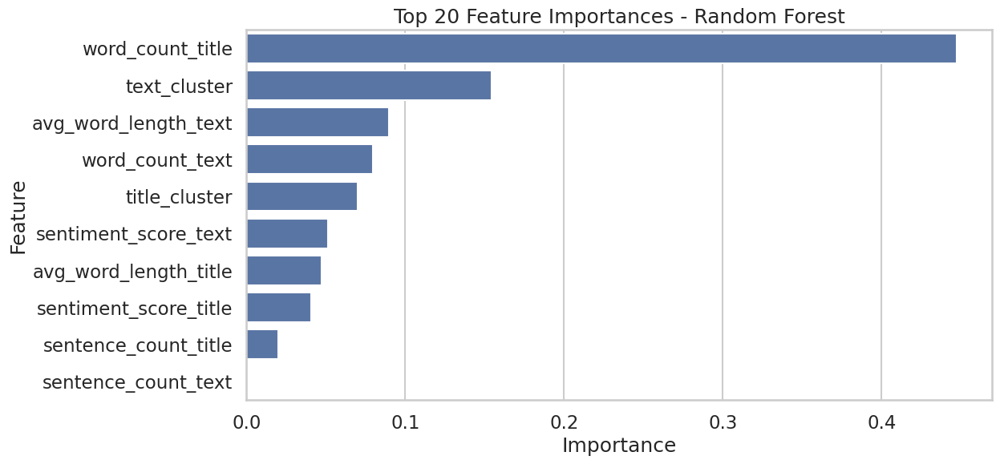

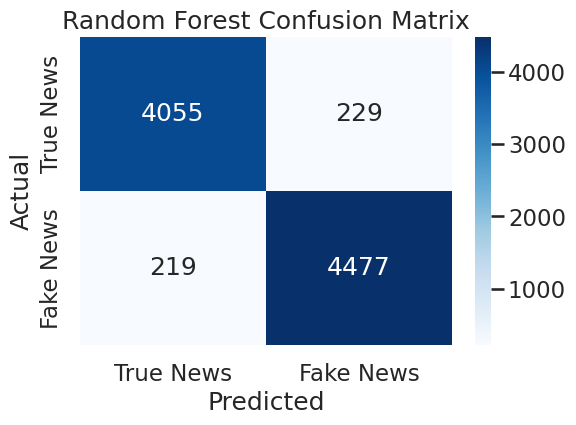

In [ ]:
# 1. Random Forest Classifier with Feature Importance
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
print("Random Forest Model Performance:")
print(classification_report(y_test, y_pred_rf))

# Plot feature importance
feature_importances = pd.DataFrame({"Feature": X_train.columns, "Importance": rf_model.feature_importances_})
feature_importances = feature_importances.sort_values(by="Importance", ascending=False)
plt.figure(figsize=(12, 6))
sns.barplot(x=feature_importances[:20]['Importance'], y=feature_importances[:20]['Feature'])
plt.title("Top 20 Feature Importances - Random Forest")
plt.show()

cm_rf = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(6, 4))
sns.heatmap(cm_rf, annot=True, fmt="d", cmap="Blues",
            xticklabels=["True News", "Fake News"],
            yticklabels=["True News", "Fake News"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Random Forest Confusion Matrix")
plt.show()


### **3.3 Logistic Regression**

Logistic Regression Model Performance:
              precision    recall  f1-score   support

           0       0.85      0.89      0.87      4284
           1       0.90      0.85      0.87      4696

    accuracy                           0.87      8980
   macro avg       0.87      0.87      0.87      8980
weighted avg       0.87      0.87      0.87      8980



/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


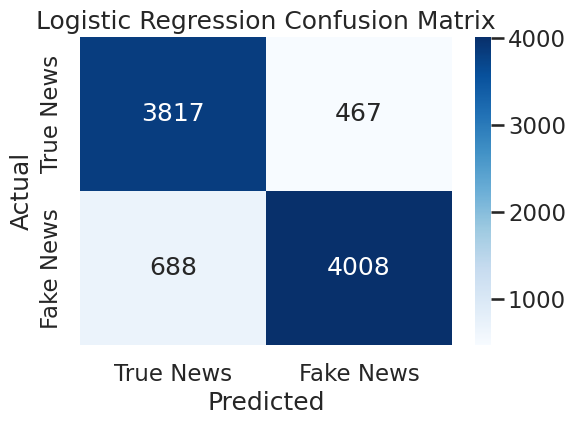

In [ ]:
# 2. Logistic Regression Model
log_reg = LogisticRegression(max_iter=500)
log_reg.fit(X_train, y_train)
y_pred_lr = log_reg.predict(X_test)
print("Logistic Regression Model Performance:")
print(classification_report(y_test, y_pred_lr))

cm_lr = confusion_matrix(y_test, y_pred_lr)
plt.figure(figsize=(6, 4))
sns.heatmap(cm_lr, annot=True, fmt="d", cmap="Blues",
            xticklabels=["True News", "Fake News"],
            yticklabels=["True News", "Fake News"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Logistic Regression Confusion Matrix")
plt.show()

### **3.4 Gradient Boost Classfier**

Gradient Boosting Classifier Report:
              precision    recall  f1-score   support

           0       0.92      0.93      0.93      4284
           1       0.94      0.93      0.93      4696

    accuracy                           0.93      8980
   macro avg       0.93      0.93      0.93      8980
weighted avg       0.93      0.93      0.93      8980



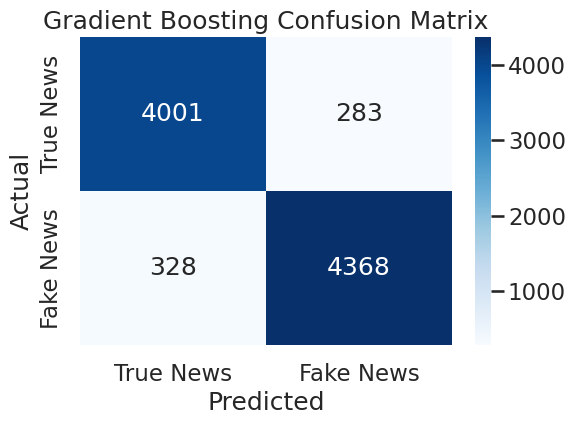

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Initialize and train GradientBoostingClassifier
gb_model = GradientBoostingClassifier(random_state=42)
gb_model.fit(X_train, y_train)
y_pred_gb = gb_model.predict(X_test)

print("Gradient Boosting Classifier Report:")
print(classification_report(y_test, y_pred_gb))

# Plot the confusion matrix
cm_gb = confusion_matrix(y_test, y_pred_gb)
plt.figure(figsize=(6, 4))
sns.heatmap(cm_gb, annot=True, fmt="d", cmap="Blues",
            xticklabels=["True News", "Fake News"],
            yticklabels=["True News", "Fake News"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Gradient Boosting Confusion Matrix")
plt.show()

# **4. Hyper Tuning for Random Forest**

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Initialize Random Forest Classifier
rf = RandomForestClassifier(random_state=42)

# Perform Grid Search with cross-validation
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid,
                           cv=5, n_jobs=-1, verbose=2, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Best parameters from Grid Search
print("Best Parameters:", grid_search.best_params_)

# Train Random Forest with the best parameters
best_rf = grid_search.best_estimator_
best_rf.fit(X_train, y_train)

# Make predictions
y_pred_rf = best_rf.predict(X_test)



Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best Parameters: {'bootstrap': True, 'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}


Final Accuracy: 0.9490
Random Forest Model Performance:
              precision    recall  f1-score   support

           0       0.95      0.94      0.95      4284
           1       0.95      0.95      0.95      4696

    accuracy                           0.95      8980
   macro avg       0.95      0.95      0.95      8980
weighted avg       0.95      0.95      0.95      8980



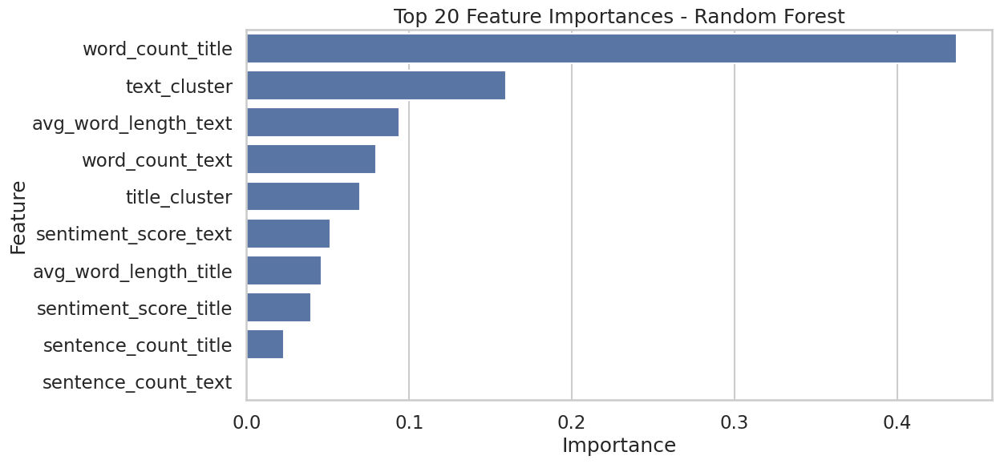

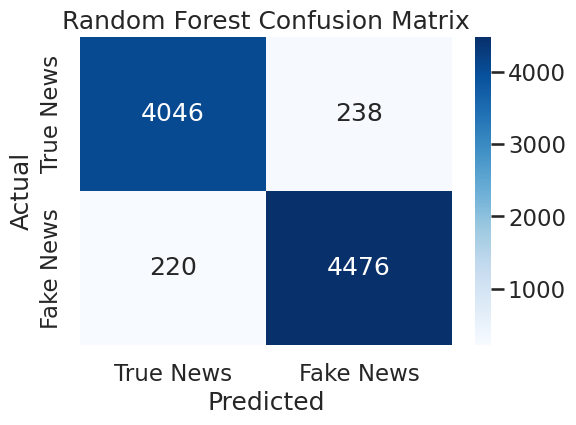

In [ ]:

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred_rf)
print(f"Final Accuracy: {accuracy:.4f}")
print("Random Forest Model Performance:")
print(classification_report(y_test, y_pred_rf))

# Feature Importance
feature_importances = pd.DataFrame({"Feature": X_train.columns, "Importance": best_rf.feature_importances_})
feature_importances = feature_importances.sort_values(by="Importance", ascending=False)

# Plot feature importance
plt.figure(figsize=(12, 6))
sns.barplot(x=feature_importances[:20]['Importance'], y=feature_importances[:20]['Feature'])
plt.title("Top 20 Feature Importances - Random Forest")
plt.show()

# Confusion Matrix
cm_rf = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(6, 4))
sns.heatmap(cm_rf, annot=True, fmt="d", cmap="Blues",
            xticklabels=["True News", "Fake News"],
            yticklabels=["True News", "Fake News"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Random Forest Confusion Matrix")
plt.show()

# **5. Extention: NLP Models**
We can enhance our analysis of the dataset by leveraging NLP models, starting with a baseline BERT approach to capture deep contextual information from the text. Once we have established this foundation, we can further improve performance by integrating a BiGRU layer on top of the BERT embeddings, enabling the model to capture additional sequence-level dependencies and better handle long-range contextual relationships. This two-step approach—beginning with BERT and then transitioning to a combined BERT+BiGRU model—provides a robust framework for accurately classifying news articles as true or fake.

## 5.1 Bert Model for Text

In [ ]:
fake_news['label'] = 0
true_news['label'] = 1
combined_news = pd.concat([fake_news, true_news], ignore_index=True)
print(combined_news.info())
print(combined_news.head())
X = combined_news['text']  # Use the 'text' column for the text data
Y = combined_news['label']  # Use the 'label' column for the labels

print(X.head())
print(Y.head())

from sklearn.model_selection import train_test_split
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44898 entries, 0 to 44897
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   title                  44898 non-null  object 
 1   text                   44898 non-null  object 
 2   subject                44898 non-null  object 
 3   date                   33285 non-null  object 
 4   label                  44898 non-null  int64  
 5   title_processed        44898 non-null  object 
 6   text_processed         44898 non-null  object 
 7   title_cluster          44898 non-null  int32  
 8   text_cluster           44898 non-null  int32  
 9   sentiment_score_text   44898 non-null  float64
 10  word_count_text        44898 non-null  float64
 11  sentence_count_text    44898 non-null  float64
 12  avg_word_length_text   44266 non-null  float64
 13  sentiment_score_title  44898 non-null  float64
 14  word_count_title       44898 non-null  float64
 15  se

In [ ]:
!pip install transformers

from transformers import BertTokenizer

# Create a tokenizer instance
bert_tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

def tokenize(X):

    X = bert_tokenizer( # Now using the bert_tokenizer instance
        text = list(X),
        add_special_tokens = True,
        max_length = 100,
        truncation = True,
        padding = 'max_length',
        return_tensors = 'tf',
        return_token_type_ids = False,
        return_attention_mask = True,
        verbose = True
        )
    return X

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

In [ ]:
X_train = tokenize(X_train)
X_test = tokenize(X_test)

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, Layer
from tensorflow.keras.models import Model
from transformers import TFBertModel

# Load a pre-trained BERT model from Hugging Face
bert_model = TFBertModel.from_pretrained("bert-base-uncased")

# Custom layer to wrap the BERT model
class BertLayer(Layer):
    def __init__(self, bert_model, **kwargs):
        super(BertLayer, self).__init__(**kwargs)
        self.bert = bert_model

    def call(self, inputs):
        # Expecting inputs to be a dictionary with 'input_ids' and 'attention_mask'
        # Returns the pooled output (typically the representation for [CLS])
        return self.bert(inputs)[1]

# Build your custom model for binary classification
def create_model(bert_model, maxlen=100):
    # Define inputs for token ids and attention masks
    input_ids = Input(shape=(maxlen,), dtype=tf.int32, name="input_ids")
    attention_mask = Input(shape=(maxlen,), dtype=tf.int32, name="attention_mask")

    # Get the pooled output from the BERT layer
    bert_layer = BertLayer(bert_model)
    pooled_output = bert_layer({'input_ids': input_ids, 'attention_mask': attention_mask})

    # Add a couple of dropout and dense layers for fine-tuning
    x = Dropout(0.5)(pooled_output)
    x = Dense(64, activation="tanh")(x)
    x = Dropout(0.5)(x)
    output = Dense(1, activation="sigmoid")(x)

    # Create the Keras model
    model = Model(inputs=[input_ids, attention_mask], outputs=output)
    return model

# Create the model and compile it
model = create_model(bert_model)
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=2e-5),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Display the model summary
model.summary()


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ attention_mask            │ (None, 100)            │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_ids (InputLayer)    │ (None, 100)            │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bert_layer (BertLayer)    │ (None, 768)            │              0 │ attention_mask[0][0],  │
│                           │                        │                │ input_ids[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 768)            │              0 │ bert_layer[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 64)             │         49,216 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 64)             │              0 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 1)              │             65 │ dropout_1[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 49,281 (192.50 KB)

 Trainable params: 49,281 (192.50 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from tensorflow.keras.optimizers import Adam

# Initialize the Adam optimizer with specified parameters
optimizer = Adam(learning_rate=1e-05, epsilon=1e-08, decay=0.01, clipnorm=1.0)

# Compile the model using binary crossentropy and accuracy as the metric
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])


/usr/local/lib/python3.11/dist-packages/keras/src/optimizers/base_optimizer.py:86: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Early stopping to halt training when validation loss does not improve for 3 epochs
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True,
    verbose=1
)

# Reduce the learning rate when validation loss plateaus
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=3,
    verbose=1,
    min_lr=1e-6
)


In [ ]:
history = model.fit(
    x={
        'input_ids': X_train['input_ids'],
        'attention_mask': X_train['attention_mask']
    },
    y=y_train,
    epochs=20,
    batch_size=30,
    validation_data=(
        {
            'input_ids': X_test['input_ids'],
            'attention_mask': X_test['attention_mask']
        },
        y_test
    ),
    callbacks=[early_stopping, reduce_lr]
)


Epoch 1/20
1198/1198 ━━━━━━━━━━━━━━━━━━━━ 60s 33ms/step - accuracy: 0.5143 - loss: 0.8088 - val_accuracy: 0.6957 - val_loss: 0.6360 - learning_rate: 1.0000e-05
Epoch 2/20
1198/1198 ━━━━━━━━━━━━━━━━━━━━ 17s 14ms/step - accuracy: 0.5600 - loss: 0.7434 - val_accuracy: 0.7986 - val_loss: 0.5742 - learning_rate: 1.0000e-05
Epoch 3/20
1198/1198 ━━━━━━━━━━━━━━━━━━━━ 17s 14ms/step - accuracy: 0.6042 - loss: 0.6821 - val_accuracy: 0.8233 - val_loss: 0.5218 - learning_rate: 1.0000e-05
Epoch 4/20
1198/1198 ━━━━━━━━━━━━━━━━━━━━ 17s 14ms/step - accuracy: 0.6347 - loss: 0.6428 - val_accuracy: 0.8454 - val_loss: 0.4787 - learning_rate: 1.0000e-05
Epoch 5/20
1198/1198 ━━━━━━━━━━━━━━━━━━━━ 17s 14ms/step - accuracy: 0.6739 - loss: 0.6036 - val_accuracy: 0.8497 - val_loss: 0.4466 - learning_rate: 1.0000e-05
Epoch 6/20
1198/1198 ━━━━━━━━━━━━━━━━━━━━ 17s 14ms/step - accuracy: 0.7047 - loss: 0.5713 - val_accuracy: 0.8548 - val_loss: 0.4213 - learning_rate: 1.0000e-05
Epoch 7/20
1198/1198 ━━━━━━━━━━━━━━━━━━━

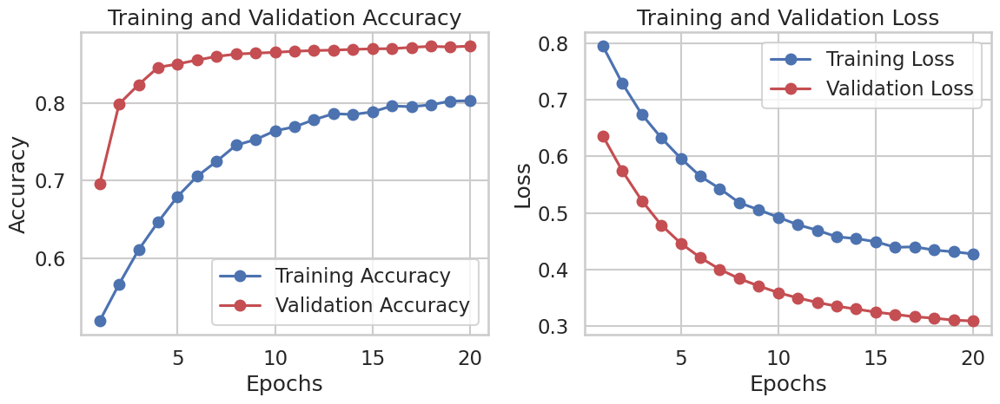

In [ ]:
import matplotlib.pyplot as plt

# Extract metrics from the history object
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(train_acc) + 1)

# Create a figure with two subplots: one for accuracy and one for loss
plt.figure(figsize=(12, 5))

# Plot accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs, train_acc, 'bo-', label='Training Accuracy')
plt.plot(epochs, val_acc, 'ro-', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Plot loss
plt.subplot(1, 2, 2)
plt.plot(epochs, train_loss, 'bo-', label='Training Loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()



281/281 ━━━━━━━━━━━━━━━━━━━━ 19s 42ms/step
Confusion Matrix:
[[4264  469]
 [ 673 3574]]


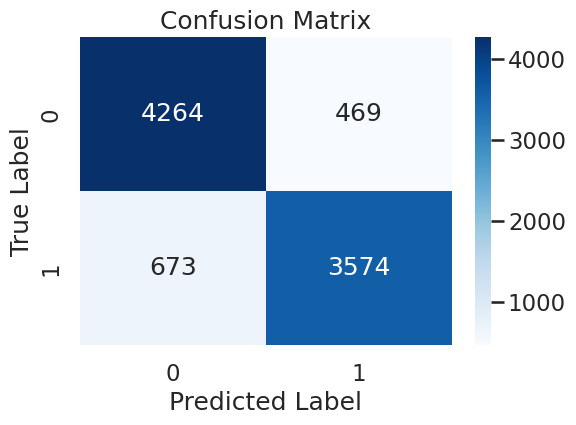


Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.90      0.88      4733
           1       0.88      0.84      0.86      4247

    accuracy                           0.87      8980
   macro avg       0.87      0.87      0.87      8980
weighted avg       0.87      0.87      0.87      8980

Accuracy: 0.87
Precision: 0.88
Recall: 0.84
F1-Score: 0.86


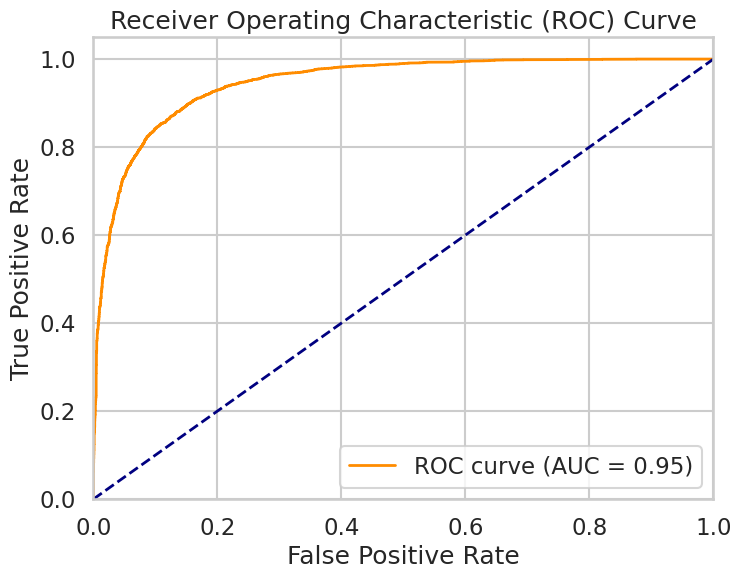

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (roc_curve, auc, confusion_matrix,
                             classification_report, accuracy_score,
                             precision_score, recall_score, f1_score)

# Generate predicted probabilities on the test set
y_pred_probs = model.predict({
    'input_ids': X_test['input_ids'],
    'attention_mask': X_test['attention_mask']
}).flatten()

# Convert predicted probabilities to binary labels using a 0.5 threshold
y_pred_labels = (y_pred_probs > 0.5).astype("int32")

# 1. Confusion Matrix
cm = confusion_matrix(y_test, y_pred_labels)
print("Confusion Matrix:")
print(cm)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# 2. Classification Report (Precision, Recall, F1-Score, Support)
print("\nClassification Report:")
print(classification_report(y_test, y_pred_labels))

# 3. Additional Metrics
accuracy = accuracy_score(y_test, y_pred_labels)
precision = precision_score(y_test, y_pred_labels)
recall = recall_score(y_test, y_pred_labels)
f1 = f1_score(y_test, y_pred_labels)

print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-Score: {:.2f}".format(f1))

# 4. ROC Curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()




## 5.2 Bert + Bidirectional-GRU Model For Text

In [ ]:
fake_news['label'] = 0
true_news['label'] = 1
combined_news = pd.concat([fake_news, true_news], ignore_index=True)
print(combined_news.info())
print(combined_news.head())
X = combined_news['text']  # Use the 'text' column for the text data
Y = combined_news['label']  # Use the 'label' column for the labels

print(X.head())
print(Y.head())

from sklearn.model_selection import train_test_split
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44898 entries, 0 to 44897
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   title                  44898 non-null  object 
 1   text                   44898 non-null  object 
 2   subject                44898 non-null  object 
 3   date                   33285 non-null  object 
 4   label                  44898 non-null  int64  
 5   title_processed        44898 non-null  object 
 6   text_processed         44898 non-null  object 
 7   title_cluster          44898 non-null  int32  
 8   text_cluster           44898 non-null  int32  
 9   sentiment_score_text   44898 non-null  float64
 10  word_count_text        44898 non-null  float64
 11  sentence_count_text    44898 non-null  float64
 12  avg_word_length_text   44266 non-null  float64
 13  sentiment_score_title  44898 non-null  float64
 14  word_count_title       44898 non-null  float64
 15  se

In [ ]:
!pip install transformers

from transformers import BertTokenizer

# Create a tokenizer instance
bert_tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

def tokenize(X):

    X = bert_tokenizer( # Now using the bert_tokenizer instance
        text = list(X),
        add_special_tokens = True,
        max_length = 100,
        truncation = True,
        padding = 'max_length',
        return_tensors = 'tf',
        return_token_type_ids = False,
        return_attention_mask = True,
        verbose = True
        )
    return X

In [ ]:
X_train = tokenize(X_train)
X_test = tokenize(X_test)

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, Bidirectional, GRU, Lambda
from tensorflow.keras.models import Model
from transformers import TFBertModel
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import (confusion_matrix, classification_report, roc_curve, auc,
                             accuracy_score, precision_score, recall_score, f1_score)

# Load pre-trained BERT model (TF 2.0)
bert_model = TFBertModel.from_pretrained("bert-base-uncased")
bert_model.trainable = True  # Allow fine-tuning

# Get the hidden size from the model configuration
hidden_dim = bert_model.config.hidden_size  # typically 768 for bert-base-uncased

def create_model_with_gru(bert_model, maxlen=100):
    # Define input layers
    input_ids = Input(shape=(maxlen,), dtype=tf.int32, name="input_ids")
    attention_mask = Input(shape=(maxlen,), dtype=tf.int32, name="attention_mask")

    # Prepare inputs as a dictionary
    bert_inputs = {"input_ids": input_ids, "attention_mask": attention_mask}

    # Wrap the BERT call in a Lambda layer to force proper tensor conversion.
    # We return the last_hidden_state which has shape: (batch_size, maxlen, hidden_dim)
    bert_outputs = Lambda(
        lambda inputs: bert_model(**inputs).last_hidden_state,
        output_shape=(maxlen, hidden_dim)
    )(bert_inputs)

    # Pass the BERT sequence output through a Bidirectional GRU layer
    x = Bidirectional(GRU(64, return_sequences=False))(bert_outputs)
    x = Dropout(0.5)(x)
    x = Dense(64, activation="tanh")(x)
    x = Dropout(0.5)(x)
    output = Dense(1, activation="sigmoid")(x)

    model = Model(inputs=[input_ids, attention_mask], outputs=output)
    return model

# Build and compile the model
model_gru = create_model_with_gru(bert_model, maxlen=100)
model_gru.compile(optimizer=Adam(learning_rate=2e-5),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

# Display model summary
model_gru.summary()

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ attention_mask            │ (None, 100)            │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_ids (InputLayer)    │ (None, 100)            │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda (Lambda)           │ (None, 100, 768)       │              0 │ attention_mask[0][0],  │
│                           │                        │                │ input_ids[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bidirectional             │ (None, 128)            │        320,256 │ lambda[0][0]           │
│ (Bidirectional)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 128)            │              0 │ bidirectional[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 64)             │          8,256 │ dropout_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 64)             │              0 │ dense_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_3 (Dense)           │ (None, 1)              │             65 │ dropout_3[0][0]        │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 328,577 (1.25 MB)

 Trainable params: 328,577 (1.25 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1, min_lr=1e-6)

history = model_gru.fit(
    x={
        'input_ids': X_train['input_ids'],
        'attention_mask': X_train['attention_mask']
    },
    y=y_train,
    epochs=20,
    batch_size=30,
    validation_data=(
        {
            'input_ids': X_test['input_ids'],
            'attention_mask': X_test['attention_mask']
        },
        y_test
    ),
    callbacks=[early_stopping, reduce_lr]
)


Epoch 1/20
1198/1198 ━━━━━━━━━━━━━━━━━━━━ 79s 53ms/step - accuracy: 0.7127 - loss: 0.5420 - val_accuracy: 0.9829 - val_loss: 0.0755 - learning_rate: 2.0000e-05
Epoch 2/20
1198/1198 ━━━━━━━━━━━━━━━━━━━━ 59s 50ms/step - accuracy: 0.9793 - loss: 0.0820 - val_accuracy: 0.9903 - val_loss: 0.0327 - learning_rate: 2.0000e-05
Epoch 3/20
1198/1198 ━━━━━━━━━━━━━━━━━━━━ 59s 50ms/step - accuracy: 0.9903 - loss: 0.0370 - val_accuracy: 0.9933 - val_loss: 0.0214 - learning_rate: 2.0000e-05
Epoch 4/20
1198/1198 ━━━━━━━━━━━━━━━━━━━━ 59s 50ms/step - accuracy: 0.9931 - loss: 0.0244 - val_accuracy: 0.9945 - val_loss: 0.0163 - learning_rate: 2.0000e-05
Epoch 5/20
1198/1198 ━━━━━━━━━━━━━━━━━━━━ 59s 50ms/step - accuracy: 0.9948 - loss: 0.0185 - val_accuracy: 0.9955 - val_loss: 0.0129 - learning_rate: 2.0000e-05
Epoch 6/20
1198/1198 ━━━━━━━━━━━━━━━━━━━━ 60s 50ms/step - accuracy: 0.9972 - loss: 0.0128 - val_accuracy: 0.9965 - val_loss: 0.0109 - learning_rate: 2.0000e-05
Epoch 7/20
1198/1198 ━━━━━━━━━━━━━━━━━━━

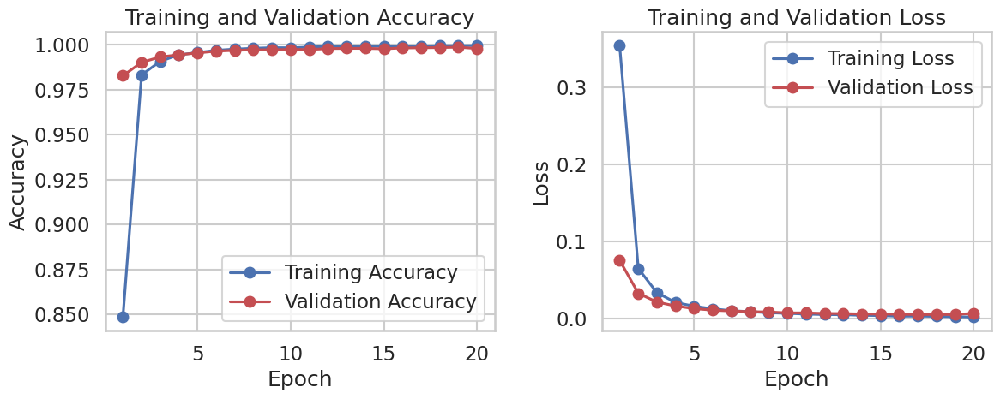

281/281 ━━━━━━━━━━━━━━━━━━━━ 11s 34ms/step
Confusion Matrix:
[[4727    6]
 [   8 4239]]


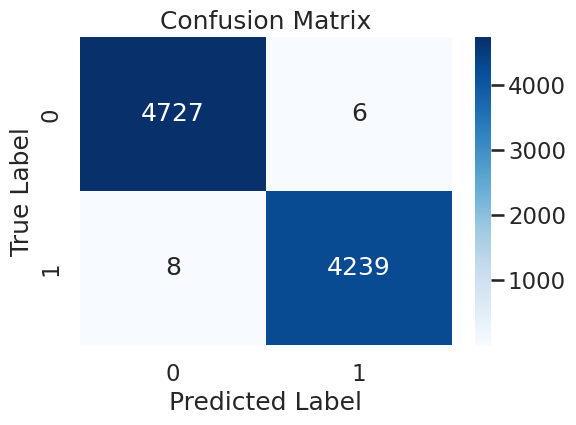

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4733
           1       1.00      1.00      1.00      4247

    accuracy                           1.00      8980
   macro avg       1.00      1.00      1.00      8980
weighted avg       1.00      1.00      1.00      8980

Accuracy: 1.00
Precision: 1.00
Recall: 1.00
F1 Score: 1.00


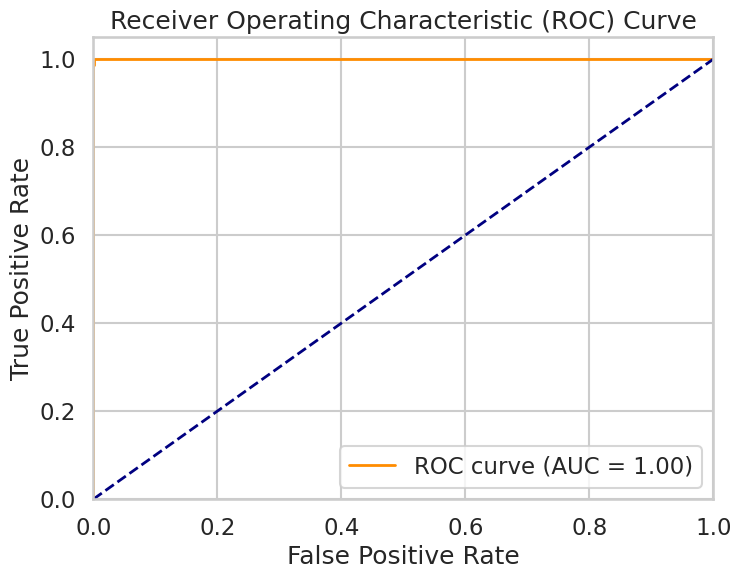

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import (confusion_matrix, classification_report, roc_curve, auc,
                             accuracy_score, precision_score, recall_score, f1_score)

# Plot training & validation accuracy and loss
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(1, len(train_acc) + 1)

plt.figure(figsize=(12, 5))
# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_acc, 'bo-', label='Training Accuracy')
plt.plot(epochs_range, val_acc, 'ro-', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_loss, 'bo-', label='Training Loss')
plt.plot(epochs_range, val_loss, 'ro-', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Evaluate the model: get predictions on the test set
y_pred_probs = model_gru.predict({
    'input_ids': X_test['input_ids'],
    'attention_mask': X_test['attention_mask']
}).flatten()

y_pred_labels = (y_pred_probs > 0.5).astype("int32")

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_labels)
print("Confusion Matrix:")
print(cm)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

# Classification Report
print("Classification Report:")
print(classification_report(y_test, y_pred_labels))

# Additional Metrics
acc = accuracy_score(y_test, y_pred_labels)
prec = precision_score(y_test, y_pred_labels)
rec = recall_score(y_test, y_pred_labels)
f1 = f1_score(y_test, y_pred_labels)
print("Accuracy: {:.2f}".format(acc))
print("Precision: {:.2f}".format(prec))
print("Recall: {:.2f}".format(rec))
print("F1 Score: {:.2f}".format(f1))

# ROC Curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_pred_probs)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


### Shap

In [ ]:
!pip install shap
import shap
import numpy as np


In [ ]:
def leave_one_token_out(model, tokenizer, input_ids, attention_mask, class_idx=0):
    """
    model: Your trained Keras model (e.g., BERT + GRU classification head).
    tokenizer: The BertTokenizer (so we can find mask_token_id).
    input_ids, attention_mask: Arrays for one sample, shape (max_len,).
    class_idx: Which output index to compare if multi-class. For binary classification with a single sigmoid, it's 0.

    Returns:
        token_importances: a list of importance values for each token.
    """
    import numpy as np

    # 1) Baseline prediction
    baseline_pred = model.predict({
        'input_ids': input_ids[np.newaxis, :],
        'attention_mask': attention_mask[np.newaxis, :]
    })[0][0]  # shape might be (1,1) => pick the first element

    token_importances = []
    max_len = input_ids.shape[0]

    # 2) Iterate over each token position
    for i in range(max_len):
        # Make a copy of input_ids
        temp_ids = input_ids.copy()

        # Replace this token with [MASK]
        # You could also use the pad token or some other special token
        temp_ids[i] = tokenizer.mask_token_id

        # 3) Re-run prediction
        pred_modified = model.predict({
            'input_ids': temp_ids[np.newaxis, :],
            'attention_mask': attention_mask[np.newaxis, :]
        })[0][0]

        # 4) Importance = absolute change in predicted probability
        importance = abs(baseline_pred - pred_modified)
        token_importances.append(importance)

    return token_importances

# Example usage:
# Pick a single sample from your test set (say index 0)
sample_ids = X_test['input_ids'][0].numpy()         # shape: (max_len,)
sample_mask = X_test['attention_mask'][0].numpy()   # shape: (max_len,)

importances = leave_one_token_out(
    model=model_gru,
    tokenizer=bert_tokenizer,
    input_ids=sample_ids,
    attention_mask=sample_mask
)

# Convert token IDs back to actual tokens
tokens = bert_tokenizer.convert_ids_to_tokens(sample_ids)

for tok, imp in zip(tokens, importances):
    print(f"{tok}: {imp:.4f}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━

Subject importance

In [ ]:
import pandas as pd

# Example subjects
subjects_dummies = pd.get_dummies(combined_news['subject'], prefix='subject')
# This yields columns like subject_Politics, subject_US-News, etc.
# Each row is 0 or 1 in exactly one column (assuming single-label subjects).

# Combine these new columns back into your DataFrame or keep them separate
combined_news = pd.concat([combined_news, subjects_dummies], axis=1)



In [ ]:
# Suppose subject_cols is a list of the new columns
subject_cols = [col for col in combined_news.columns if col.startswith('subject_')]
# For instance: ['subject_Politics', 'subject_US-News', 'subject_Worldnews', ...]

# Build the numeric array
X_subject = combined_news[subject_cols].values  # shape: (num_samples, num_subjects)


In [ ]:
from sklearn.model_selection import train_test_split

X_text = combined_news["text_processed"]  # or however you get your text
y = combined_news["label"]                # 0/1 for fake vs real

X_train_text, X_test_text, X_train_sub, X_test_sub, y_train, y_test = train_test_split(
    X_text,
    X_subject,
    y,
    test_size=0.2,
    random_state=42
)


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Dropout, Concatenate, Bidirectional, GRU, Lambda
from tensorflow.keras.models import Model
from transformers import TFBertModel

def create_model_with_subject(bert_model, num_subjects, maxlen=100):
    # 1) BERT text inputs
    input_ids = Input(shape=(maxlen,), dtype=tf.int32, name="input_ids")
    attention_mask = Input(shape=(maxlen,), dtype=tf.int32, name="attention_mask")

    # 2) Subject input
    subject_input = Input(shape=(num_subjects,), dtype=tf.float32, name="subject_input")

    # 3) BERT call via a Lambda layer
    bert_outputs = Lambda(
        lambda inputs: bert_model(**inputs).last_hidden_state,
        output_shape=(maxlen, bert_model.config.hidden_size)
    )({"input_ids": input_ids, "attention_mask": attention_mask})

    # 4) GRU on BERT's sequence output
    x = Bidirectional(GRU(64, return_sequences=False))(bert_outputs)
    x = Dropout(0.5)(x)

    # 5) Concatenate subject features
    merged = Concatenate()([x, subject_input])

    # 6) Classification head
    merged = Dense(64, activation="tanh")(merged)
    merged = Dropout(0.5)(merged)
    output = Dense(1, activation="sigmoid")(merged)

    model = Model(inputs=[input_ids, attention_mask, subject_input], outputs=output)
    return model


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1, min_lr=1e-6)


In [ ]:
!pip install transformers
from transformers import BertTokenizer

# Load pre-trained BERT tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased') # Or any other BERT variant you prefer

train_encodings = tokenizer(X_train_text.tolist(), truncation=True, padding='max_length', max_length=100) # Make sure X_train_text is a list
X_train_ids = np.array(train_encodings['input_ids'])
X_train_mask = np.array(train_encodings['attention_mask'])
bert_model = TFBertModel.from_pretrained("bert-base-uncased")
bert_model.trainable = True
test_encodings = tokenizer(
    X_test_text.tolist(),  # Convert test Series to a list
    truncation=True,
    padding='max_length',
    max_length=100
)

# 2) Convert to NumPy arrays
X_test_ids = np.array(test_encodings['input_ids'])
X_test_mask = np.array(test_encodings['attention_mask'])
num_subjects = len(subject_cols)  # e.g. 5
model = create_model_with_subject(bert_model, num_subjects, maxlen=100)
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=2e-5),
    loss='binary_crossentropy',
    metrics=['accuracy']
)


# Train
history = model.fit(
    x={
        'input_ids': X_train_ids,          # shape (train_samples, 100)
        'attention_mask': X_train_mask,    # shape (train_samples, 100)
        'subject_input': X_train_sub       # shape (train_samples, num_subjects)
    },
    y=y_train,
    validation_data=(
        {
            'input_ids': X_test_ids,
            'attention_mask': X_test_mask,
            'subject_input': X_test_sub
        },
        y_test
    ),
    epochs=3,
    batch_size=32
)


Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

Epoch 1/3
1123/1123 ━━━━━━━━━━━━━━━━━━━━ 74s 54ms/step - accuracy: 0.7475 - loss: 0.5015 - val_accuracy: 0.9849 - val_loss: 0.0690
Epoch 2/3
1123/1123 ━━━━━━━━━━━━━━━━━━━━ 58s 52ms/step - accuracy: 0.9837 - loss: 0.0738 - val_accuracy: 0.9916 - val_loss: 0.0292
Epoch 3/3
1123/1123 ━━━━━━━━━━━━━━━━━━━━ 58s 52ms/step - accuracy: 0.9915 - loss: 0.0331 - val_accuracy: 0.9943 - val_loss: 0.0190


In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score

y_pred_probs = model.predict({
    'input_ids': X_test_ids,
    'attention_mask': X_test_mask,
    'subject_input': X_test_sub
}).flatten()
y_pred = (y_pred_probs > 0.5).astype(int)

baseline_acc = accuracy_score(y_test, y_pred)
print("Baseline accuracy:", baseline_acc)


281/281 ━━━━━━━━━━━━━━━━━━━━ 12s 35ms/step
Baseline accuracy: 0.9943207126948775


In [ ]:
importances = []
X_test_sub_copy = X_test_sub.copy()  # shape (test_samples, num_subjects)

for col_idx in range(num_subjects):
    # 1) Shuffle one column
    X_test_sub_shuf = X_test_sub_copy.copy()
    np.random.shuffle(X_test_sub_shuf[:, col_idx])  # shuffle in place

    # 2) Re-predict
    y_pred_probs_shuf = model.predict({
        'input_ids': X_test_ids,
        'attention_mask': X_test_mask,
        'subject_input': X_test_sub_shuf
    }).flatten()
    y_pred_shuf = (y_pred_probs_shuf > 0.5).astype(int)

    # 3) Compute new accuracy
    acc_shuf = accuracy_score(y_test, y_pred_shuf)
    drop = baseline_acc - acc_shuf
    importances.append(drop)

for i, imp in enumerate(importances):
    print(f"Feature '{subject_cols[i]}' importance: {imp:.4f}")


281/281 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step
281/281 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step
281/281 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step
281/281 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step
281/281 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step
281/281 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step
281/281 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step
281/281 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step
Feature 'subject_Government News' importance: 0.0001
Feature 'subject_Middle-east' importance: 0.0000
Feature 'subject_News' importance: 0.0006
Feature 'subject_US_News' importance: 0.0000
Feature 'subject_left-news' importance: 0.0000
Feature 'subject_politics' importance: 0.0002
Feature 'subject_politicsNews' importance: 0.0004
Feature 'subject_worldnews' importance: -0.0001
